In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
from matplotlib import pyplot as plt, cm as mpl_cm
from cycler import cycler

sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.0 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [4]:
import os
os.chdir("/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_h5")

In [5]:
adata1=sc.read_h5ad('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad')

In [6]:
# adata16=sc.read_h5ad('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad')

In [7]:
# adata16

In [8]:
adata1

AnnData object with n_obs × n_vars = 245834 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [9]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()
%load_ext rpy2.ipython


In [10]:
%%R -w 500 -h 300 
TCRdir="/data1/maolp/Rstudy/GaofengSinglecell/Gaofeng_All_matrix/Allcount/TCR_all/"
TCRsamples=list.files(path = TCRdir,"csv")
AllTCR=data.frame()
for (line in TCRsamples) {
#   print(line)
  name=gsub("_TCR_filtered_contig_annotations.csv","",line)
  print(name)
  if (!name %in% c("C27","Z28")){
     Test_TCR<-read.csv(file.path(TCRdir,line))
     Test_TCR$barcodename=paste0(name,"_",Test_TCR$barcode)
     Test_TCR$Group<-name
     AllTCR=rbind(AllTCR,Test_TCR)
  }
 
}
head(AllTCR)


[1] "B25"
[1] "B9"
[1] "C10"
[1] "C25"
[1] "C27"
[1] "C36"
[1] "D25"
[1] "D27"
[1] "D36"
[1] "D9"
[1] "Z03"
[1] "Z07"
[1] "z104"
[1] "Z123"
[1] "Z28"
[1] "Z33"
[1] "Z36"
[1] "Z38"
[1] "Z42"
[1] "Z43"
[1] "Z47"
[1] "Z48"
[1] "Z50"
[1] "Z52"
[1] "Z53"
[1] "Z67"
[1] "Z70"
[1] "Z77"
[1] "Z79"
[1] "Z96"
[1] "Z98"
[1] "Z99"
             barcode is_cell                   contig_id high_confidence length
1 AAACCTGAGCACCGCT-1    true AAACCTGAGCACCGCT-1_contig_1            true    509
2 AAACCTGAGCACCGCT-1    true AAACCTGAGCACCGCT-1_contig_2            true    506
3 AAACCTGAGCGAAGGG-1    true AAACCTGAGCGAAGGG-1_contig_1            true    464
4 AAACCTGAGCGAAGGG-1    true AAACCTGAGCGAAGGG-1_contig_2            true    488
5 AAACCTGAGCGAAGGG-1    true AAACCTGAGCGAAGGG-1_contig_3            true    651
6 AAACCTGCAAACGCGA-1    true AAACCTGCAAACGCGA-1_contig_1            true    492
  chain       v_gene d_gene  j_gene c_gene full_length productive
1   TRB     TRBV20-1        TRBJ2-7  TRBC2        true

In [11]:
mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRTCR/

In [12]:
%%R -w 500 -h 300 
getwd()
write.csv(AllTCR,"/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRTCR/Gao_All_TCR.csv")

In [13]:
path_data = "/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRTCR"
# path_bcr_input = f"{path_data}/Gao_All_BCR.csv"
path_tcr_input = f"{path_data}/Gao_All_TCR.csv"

In [14]:
# path_bcr_csv = f"{path_data}/BCR_read_aligned.csv"
# path_bcr_out = f"{path_data}/BCR_preprocessed.h5ad"

path_tcr_csv = f"{path_data}/TCR_read_aligned.csv"
path_tcr_out = f"{path_data}/TCR_preprocessed.h5ad"

In [15]:
df_tcr_raw = pd.read_csv(path_tcr_input, index_col=0)

df_tcr_raw["barcode"] =df_tcr_raw["barcodename"]

df_tcr_raw.to_csv(path_tcr_csv)

In [16]:
df_tcr_raw["productive"].value_counts()

True    154563
Name: productive, dtype: int64

In [17]:
adata_tcr = ir.io.read_10x_vdj(path_tcr_csv)
print(f"Amount cells: {len(adata_tcr)}")

Amount cells: 78452


In [18]:
ir.pp.merge_with_ir(adata1, adata_tcr)

In [19]:
ir.tl.chain_qc(adata1)

# ir.tl.chain_qc(adata_tcr2)

In [20]:
adata1_IR = adata1[adata1.obs['chain_pairing'] != 'no IR']
ir.tl.chain_qc(adata1_IR)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scirpy/tl/_chain_qc.py:162: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[col_receptor_type] = res_receptor_type


In [21]:
adata_tcr2=adata_tcr
import pandas as pd
TCRmerged_obs = adata_tcr2.obs.merge(adata1.obs, left_index=True, right_index=True, how='left', suffixes=('', '_y'))
adata_tcr2.obs = TCRmerged_obs
ir.tl.chain_qc(adata_tcr2)

In [22]:
mkdir -p /home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure

In [23]:
abundance_AdjustedID=ir.tl.group_abundance(
    adata_tcr2, groupby="AdjustedID", target_col="chain_pairing", sort="alphabetical"
)

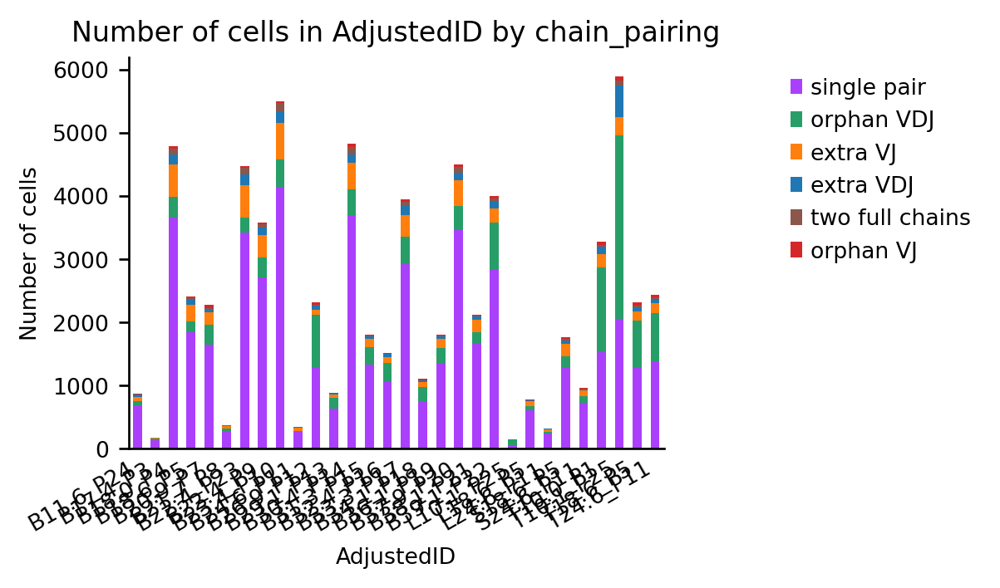

In [24]:
_=ir.pl.group_abundance(
    adata_tcr2, groupby="AdjustedID", target_col="chain_pairing", sort="alphabetical"
)

In [25]:
%%R
source("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/color.R")

In [26]:
%%R
col1

[1] "#8A4198FF" "#145096"   "#f6c619"   "#e9412f"   "#008EA0FF" "#266b69"  
[7] "#3178a2"  


In [27]:
mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Data

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.1     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


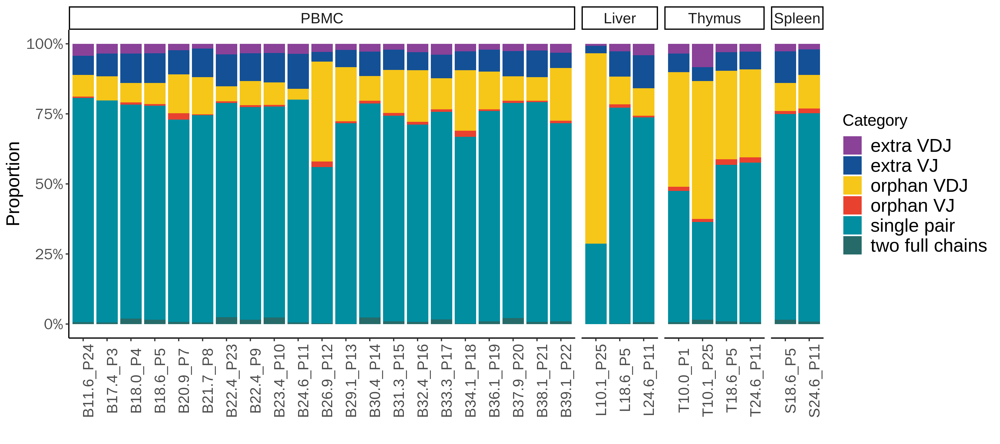

In [28]:
%%R -i  abundance_AdjustedID -w 3600 -h 1600 -r 300
library(tidyverse)
library(ggplot2)
library(ggsci)

# plot_proportions <- function(data, output_file) {
  data_prop <- abundance_AdjustedID %>% rownames_to_column(var = "tissue") %>%
    mutate(total = rowSums(.[, -1])) %>%
    mutate(across(starts_with("single") | starts_with("orphan") | starts_with("extra") | starts_with("two"), ~ . / total, .names = "prop_{.col}"))
  data_prop 
  data_long <- data_prop %>%
    select(tissue, starts_with("prop")) %>%
    pivot_longer(cols = starts_with("prop"),
                 names_to = "category",
                 values_to = "proportion") %>%
    mutate(category = str_remove(category, "prop_"))
  data_long
#   data_long$tissue <- factor(data_long$tissue, level = c('PBMC', 'Liver', 'Thymus', 'Spleen'))
  library(dplyr)
library(stringr)

data_long$Organ <- str_sub(data_long$tissue, 1, 1)


data_long <- data_long %>%
  mutate(Organ = case_when(
    Organ == "B" ~ "PBMC",
    Organ == "L" ~ "Liver",
    Organ == "S" ~ "Spleen",
    Organ == "T" ~ "Thymus"
  ))
data_long$Organ<-factor(data_long$Organ,level=c('PBMC','Liver','Thymus','Spleen'))
Ppcen_sample <- ggplot(data_long, aes(x = tissue, y = proportion, fill = category)) +
  geom_col() +
  scale_y_continuous(labels = scales::percent) +
  labs(x = "Tissue", y = "Proportion", fill = "Category") +
  theme_classic() +
  xlab('') +
  theme(text = element_text(size = 16),
        legend.position = "right",
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 16),
        axis.text.x = element_text(angle = 90)) +
  scale_fill_d3() +scale_fill_manual(values=col1)+
    facet_grid(. ~ Organ, space = "free", scales = "free", switch = "y")  # 使用 Organ 列进行分面显示

write.csv(data_long,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Data/Figure4A_TCRF2_allsamplepercentage.csv")
print(Ppcen_sample)
 Ppcen_sample 
ggsave(plot = Ppcen_sample, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4A_TCRF2_allsamplepercentage.pdf', width = 12, height = 5)
  
#   return(Ppcen)
# }


# plot_proportions(abundance_AdjustedID, "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TCRF2_allsamplepercentage.pdf")


In [29]:
testabundance = ir.tl.group_abundance(
    adata1_IR, groupby="New_Body", target_col="chain_pairing", sort="alphabetical"
)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


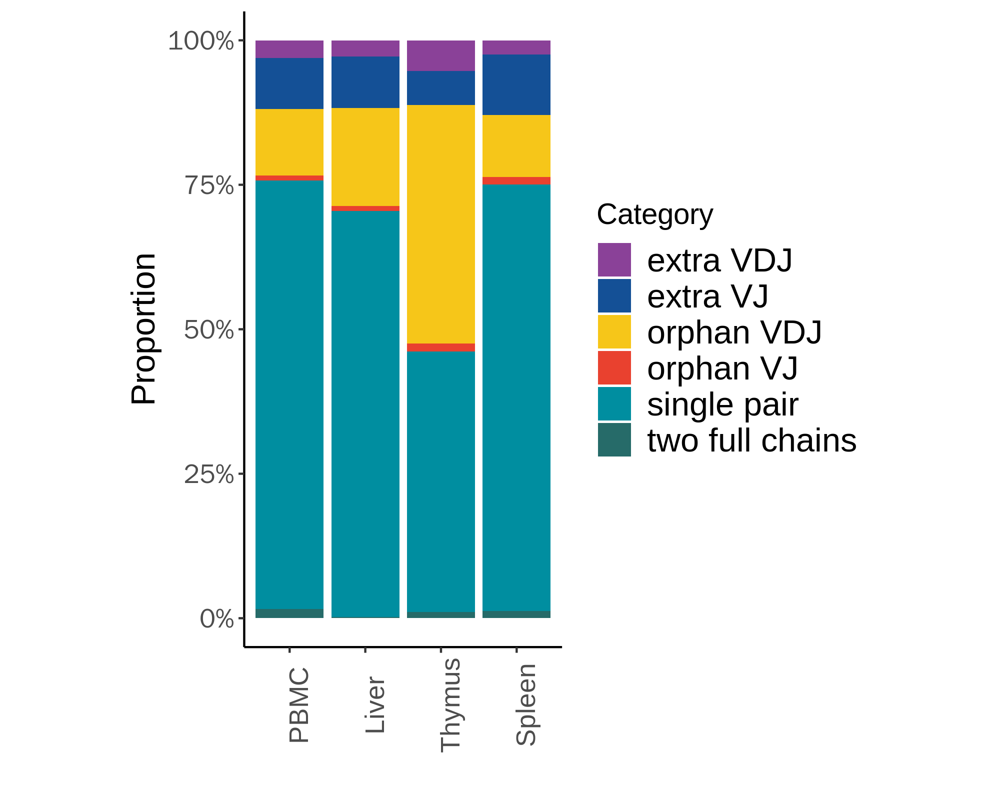

In [30]:
%%R -i testabundance -w 2000 -h 1600 -r 300
library(tidyverse)
library(ggplot2)
library(ggsci)

plot_proportions <- function(data, output_file) {
  data_prop <- data %>% rownames_to_column(var = "tissue") %>%
    mutate(total = rowSums(.[, -1])) %>%
    mutate(across(starts_with("single") | starts_with("orphan") | starts_with("extra") | starts_with("two"), ~ . / total, .names = "prop_{.col}"))
  
  data_long <- data_prop %>%
    select(tissue, starts_with("prop")) %>%
    pivot_longer(cols = starts_with("prop"),
                 names_to = "category",
                 values_to = "proportion") %>%
    mutate(category = str_remove(category, "prop_"))
  
  data_long$tissue <- factor(data_long$tissue, level = c('PBMC', 'Liver', 'Thymus', 'Spleen'))
  
  Ppcen <- ggplot(data_long, aes(x = tissue, y = proportion, fill = category)) +
    geom_col() +
    scale_y_continuous(labels = scales::percent) +
    labs(x = "Tissue", y = "Proportion", fill = "Category") +
    theme_classic() +
    xlab('') +
    theme(text = element_text(size = 16),
          legend.position = "right",
          legend.title = element_text(size = 14),
          legend.text = element_text(size = 16),
          axis.text.x=element_text(angle=90),
         aspect.ratio = 2) +
    scale_fill_d3()+scale_fill_manual(values=col1)
  
  ggsave(plot = Ppcen, filename = output_file, width = 6, height = 5)
  write.csv(data_long,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Data/Figure4B_TCRF2_allsamplepercentage.csv")
  return(Ppcen)
}


plot_proportions(testabundance, "/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4B_TCRF2_allsamplepercentage.pdf")

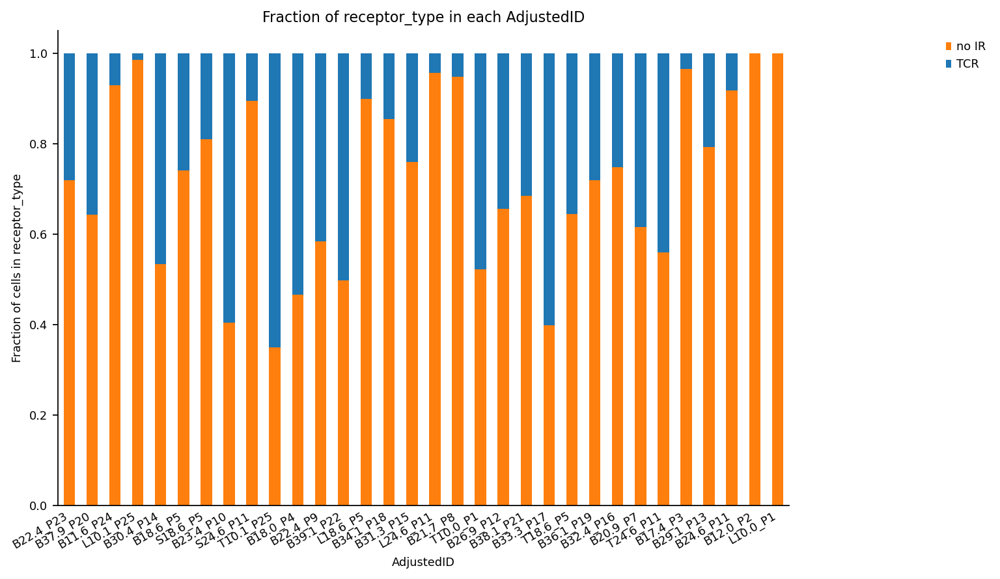

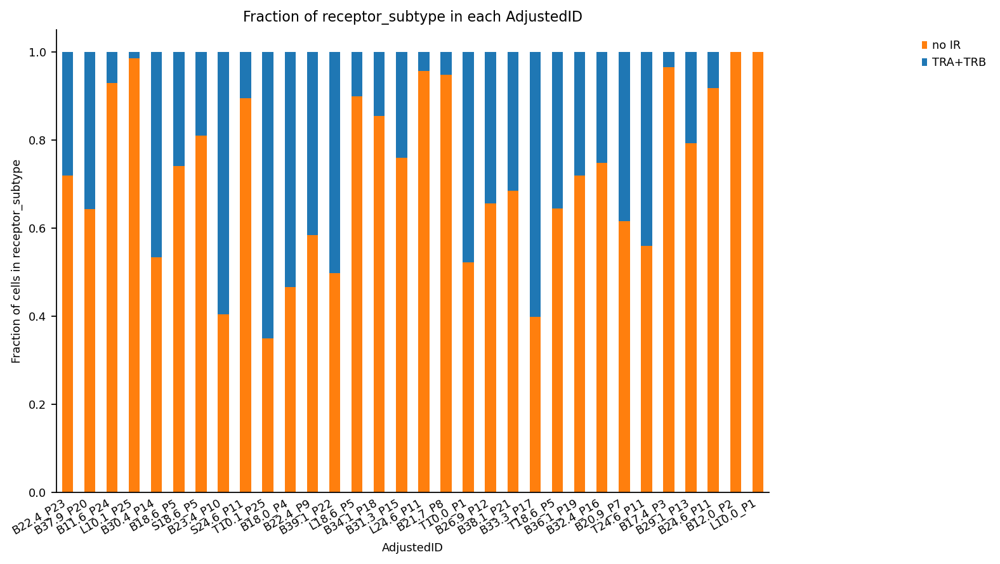

In [31]:
_ = ir.pl.group_abundance(
    adata1, groupby="AdjustedID", target_col="receptor_type", normalize=True,fig_kws={"figsize": (9, 6)}
)
_ = ir.pl.group_abundance(
    adata1, groupby="AdjustedID", target_col="receptor_subtype", normalize=True,fig_kws={"figsize": (9, 6)}
)

In [32]:
# sc.pl.umap(adata1_IR, color="chain_pairing", groups="multichain")

In [33]:
adata= adata1_IR[adata1_IR.obs["chain_pairing"] != "multichain", :].copy()
adata = adata[~adata.obs["chain_pairing"].isin(["orphan VDJ", "orphan VJ"]), :].copy()


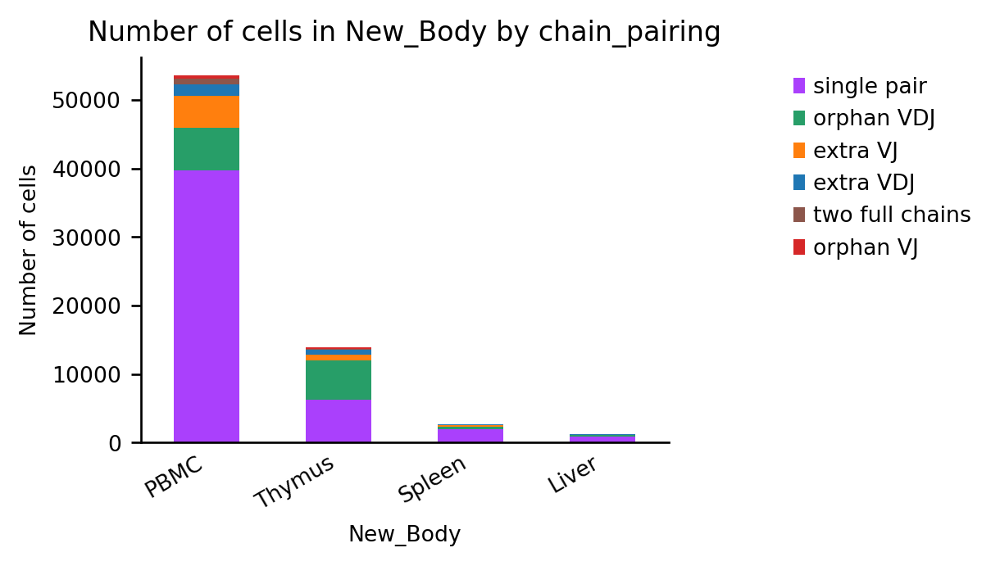

In [34]:
ax = ir.pl.group_abundance(adata1_IR, groupby="New_Body", target_col="chain_pairing")

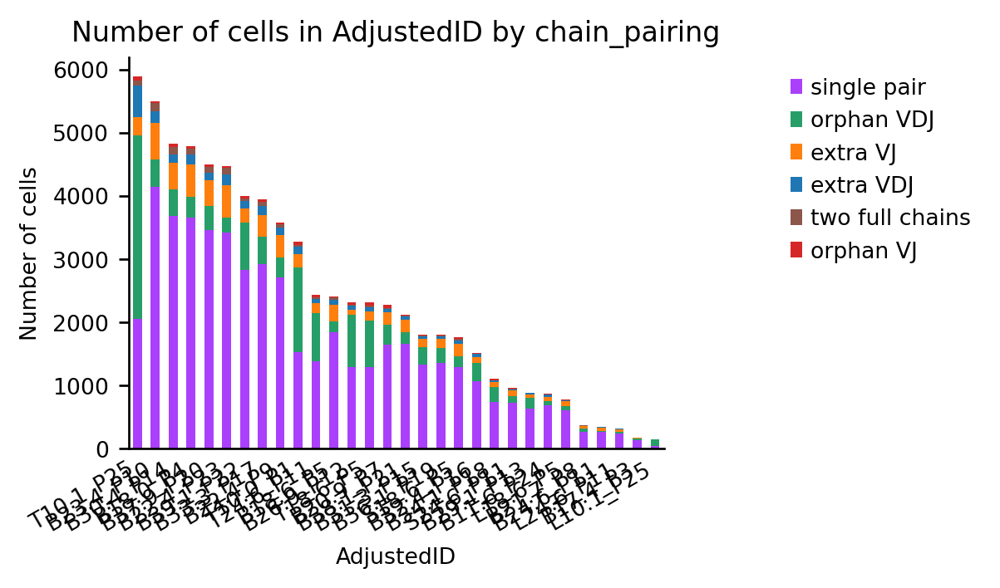

In [35]:
ax = ir.pl.group_abundance(adata1_IR, groupby="AdjustedID", target_col="chain_pairing")

In [36]:
abundance_AdjustedIDcount=ir.tl.group_abundance(
    adata_tcr2, groupby="AdjustedID", target_col="chain_pairing", sort="alphabetical"
)
# abundance_AdjustedIDcount

In [37]:
abundance_Organcount=ir.tl.group_abundance(
    adata_tcr2, groupby="New_Body", target_col="chain_pairing", sort="alphabetical"
)
# abundance_AdjustedIDcount

In [38]:
mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


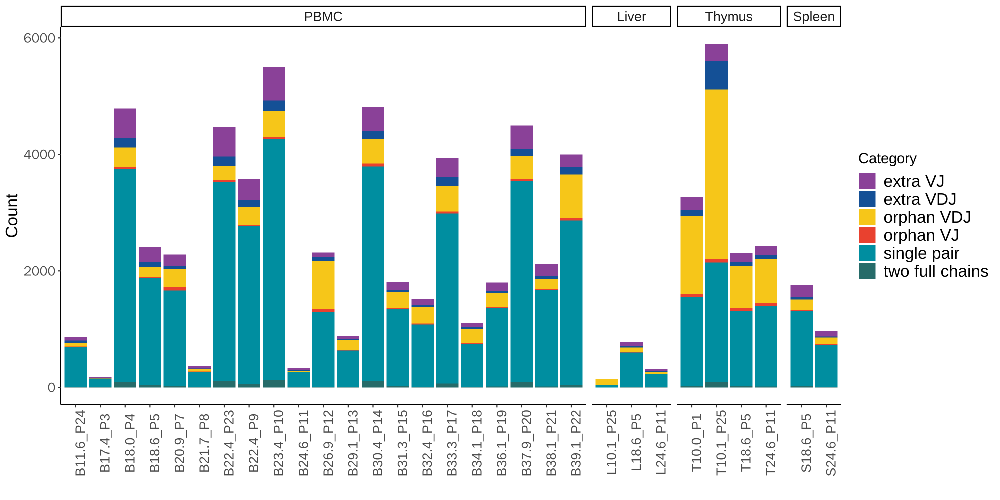

In [39]:
%%R -i  abundance_Organcount -i abundance_AdjustedIDcount -w 4000 -h 2000 -r 300
library(reshape2)
abundance_AdjustedIDcount$Sample<-rownames(abundance_AdjustedIDcount)
# rownames_to_collumn(abundance_AdjustedIDcount)
# melt(abundance_AdjustedIDcount)
abundance_AdjustedIDcount2<-melt(abundance_AdjustedIDcount,id.vars=c('Sample'))
abundance_AdjustedIDcount2$Organ <- str_sub(abundance_AdjustedIDcount2$Sample, 1, 1)
abundance_AdjustedIDcount2<- abundance_AdjustedIDcount2 %>%
  mutate(Organ = case_when(
    Organ == "B" ~ "PBMC",
    Organ == "L" ~ "Liver",
    Organ == "S" ~ "Spleen",
    Organ == "T" ~ "Thymus"
  ))
abundance_AdjustedIDcount2$Organ<-factor(abundance_AdjustedIDcount2$Organ,level=c('PBMC','Liver','Thymus','Spleen'))
abundance_AdjustedIDcount2$variable<-factor(abundance_AdjustedIDcount2$variable,levels=c("extra VJ",
"extra VDJ",
"orphan VDJ","orphan VJ",
"single pair",
"two full chains"
))
P1=ggplot(abundance_AdjustedIDcount2, aes(x = Sample, y = value, fill =variable)) +
  geom_col() +
#   scale_y_continuous(labels = scales::percent) +
  labs(x = "Tissue", y = "Count", fill = "Category") +
  theme_classic() +
  xlab('') +
  theme(text = element_text(size = 16),
        legend.position = "right",
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 16),
        axis.text.x = element_text(angle = 90)) +
  scale_fill_d3()+scale_fill_manual(values=col1) +
    facet_grid(. ~ Organ, space = "free", scales = "free", switch = "y")  # 使用 Organ 列进行分面显示
write.csv(abundance_AdjustedIDcount2,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Data/S28A_TCRF2_allsamplepercentage.csv")
ggsave(plot=P1,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28A_TCRF2_allsamplepercentage.pdf",width=12,height=4)
P1

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


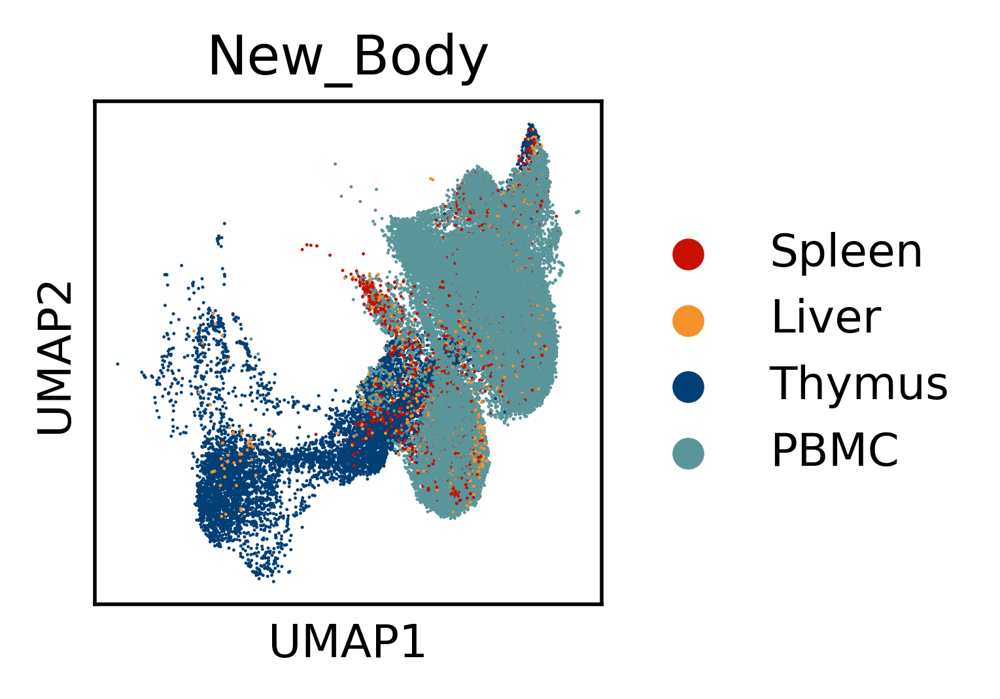

In [40]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams['figure.dpi'] = 250
sc.pl.umap(adata,color='New_Body',palette=['#C71000FF',"#f49128","#023f75","#5A9599FF"],show=False)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28A_TCR_allsamplorgan.pdf")

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


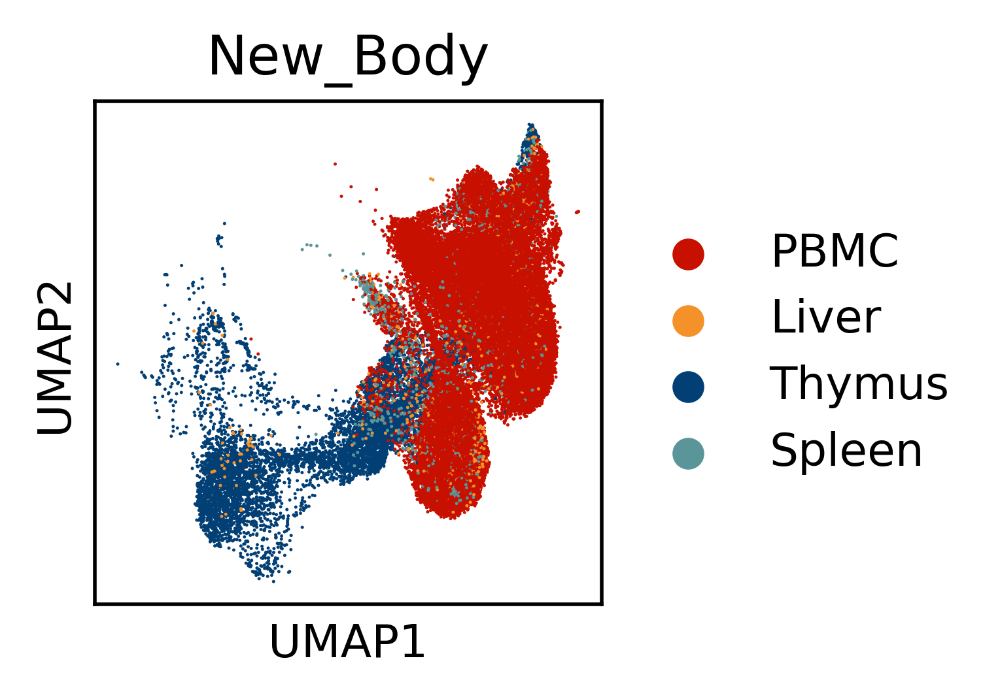

In [41]:
import pandas as pd

adata.obs['New_Body'] = pd.Categorical(adata.obs['New_Body'], 
                                        categories=["PBMC", "Liver", "Thymus", "Spleen"], 
                                        ordered=True)

sc.pl.umap(adata, color='New_Body', palette=['#C71000FF',"#f49128","#023f75","#5A9599FF"],show=False)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4C_TCR_allsamplorgan.pdf")

In [42]:
# %%R
# abundance_Organcount2

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


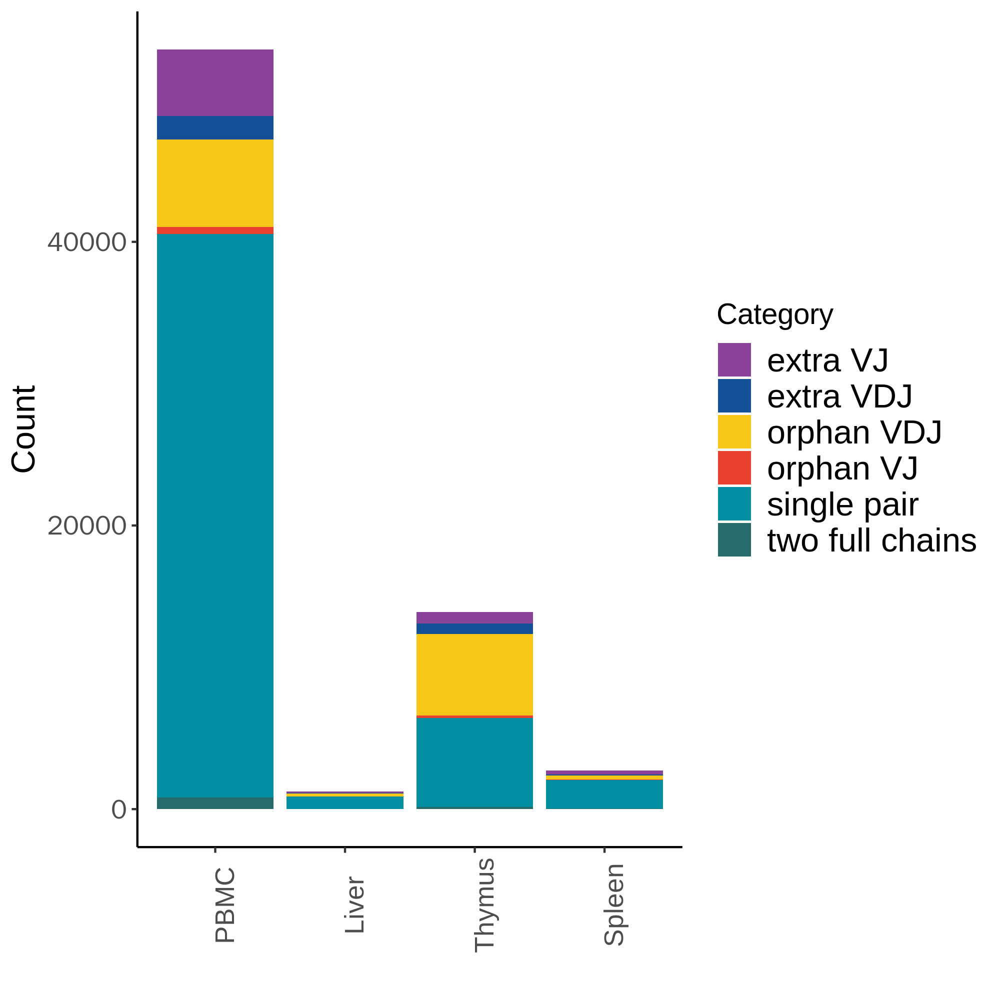

In [43]:
%%R -i  abundance_Organcount -w 2000 -h 2000 -r 300
abundance_Organcount$Sample<-rownames(abundance_Organcount)
# rownames_to_collumn(abundance_Organcount)
# melt(abundance_Organcount)
abundance_Organcount2<-melt(abundance_Organcount,id.vars=c('Sample'))
# abundance_Organcount2$Organ <- str_sub(abundance_Organcount2$Sample, 1, 1)
# abundance_Organcount2<- abundance_Organcount2 %>%
#   mutate(Organ = case_when(
#     Organ == "B" ~ "PBMC",
#     Organ == "L" ~ "Liver",
#     Organ == "S" ~ "Spleen",
#     Organ == "T" ~ "Thymus"
#   ))
abundance_Organcount2$Sample<-factor(abundance_Organcount2$Sample,level=c('PBMC','Liver','Thymus','Spleen'))
abundance_Organcount2$variable<-factor(abundance_Organcount2$variable,levels=c("extra VJ",
"extra VDJ",
"orphan VDJ","orphan VJ",
"single pair",
"two full chains"
))
P2=ggplot(abundance_Organcount2, aes(x =Sample, y = value, fill =variable)) +
  geom_col() +
#   scale_y_continuous(labels = scales::percent) +
  labs(x = "Tissue", y = "Count", fill = "Category") +
  theme_classic() +
  xlab('') +
  theme(text = element_text(size = 16),
        legend.position = "right",
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 16),
        axis.text.x = element_text(angle = 90)) +
  scale_fill_d3() +scale_fill_manual(values=col1) 
write.csv(abundance_Organcount2,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Data/S28B_TCRF2_sumsamplepercentage.csv")
ggsave(plot=P2,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28B_TCRF2_sumsamplepercentage.pdf",width=6,height=4)
P2

In [44]:
# ls

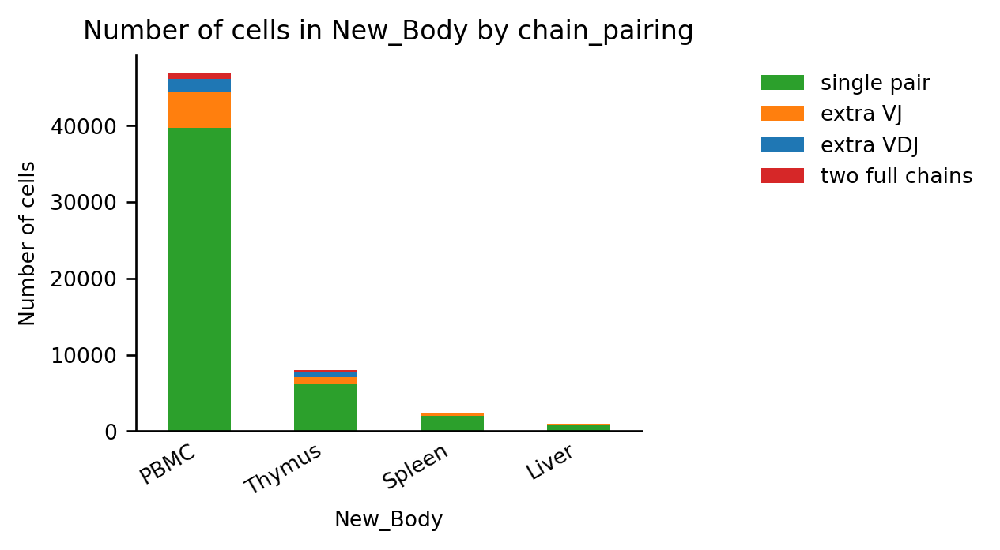

In [45]:
ax = ir.pl.group_abundance(adata, groupby="New_Body", target_col="chain_pairing")

In [46]:
adata1_IR.obs['Last_cell_type'].value_counts()

Naïve CD4 T          35595
Naïve CD8 T          14027
DP(P) T               5561
abT(entry)            5005
Treg                  4121
DP(Q) T               1888
Th17like_INNATE_T     1818
NK T                  1556
DN(Q) T                723
GNG4 +CD8aa+T          667
Tem                    425
Cycling Treg            41
ILC2/3                   8
Name: Last_cell_type, dtype: int64

In [47]:
adata1_IR.obs['Last_cell_type'].value_counts()

Naïve CD4 T          35595
Naïve CD8 T          14027
DP(P) T               5561
abT(entry)            5005
Treg                  4121
DP(Q) T               1888
Th17like_INNATE_T     1818
NK T                  1556
DN(Q) T                723
GNG4 +CD8aa+T          667
Tem                    425
Cycling Treg            41
ILC2/3                   8
Name: Last_cell_type, dtype: int64

In [48]:
# create_palette(adata1.obs["AdjustedID"].unique(),colorname2)
adata1_IR.obs["chain_pairing"].unique()

['extra VDJ', 'single pair', 'orphan VDJ', 'extra VJ', 'two full chains', 'orphan VJ']
Categories (6, object): ['extra VDJ', 'extra VJ', 'orphan VDJ', 'orphan VJ', 'single pair', 'two full chains']

In [49]:
col1=["#8A4198FF",  "#145096","#f6c619","#e9412f", "#008EA0FF", 
 "#266b69", "#3178a2"]
def create_palette(cell_types, colors):
    cell_type_colors = {}
    for i, cell_type in enumerate(cell_types):
        color = colors[i % len(colors)]
        cell_type_colors[cell_type] = color
    return cell_type_colors

colorname2=["#868686", "#B5AD64","#9DA8E2","#46A040" ,"#00AF99", "#FFC179" ,"#98D9E9" ,"#F6313E", "#FFA300", "#333366", "#FF5A00", "#663366","#FF6666",
"#8F1336", "#0081C9", "#001588", "#CC0033","#CC9966","#CC0033","#999933","#009966","#CCCC33","#CCFF99","#333399","#993333",
"#490C65", "#BA7FD0","#A6CEE3", "#1F78B4", "#DE77AE", "#B2DF8A", "#006D2C", "#91C392","#FF9900","#339966","#46A040" ,"#00AF99", "#FFC179" ,"#98D9E9" ,"#F6313E"]

In [52]:
create_palette(adata1_IR.obs["chain_pairing"].unique(),col1)

{'extra VDJ': '#8A4198FF',
 'single pair': '#145096',
 'orphan VDJ': '#f6c619',
 'extra VJ': '#e9412f',
 'two full chains': '#008EA0FF',
 'orphan VJ': '#266b69'}

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


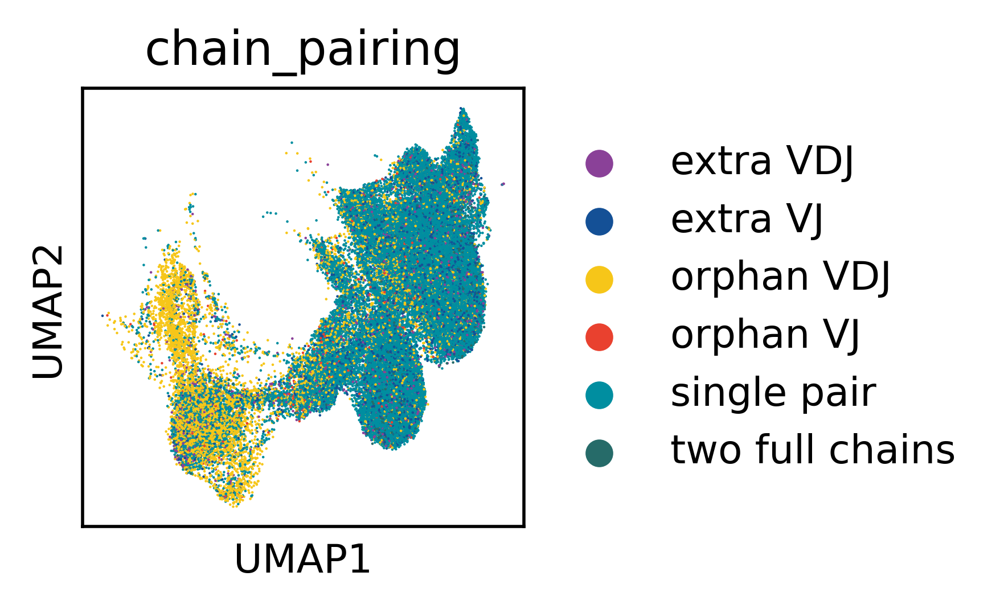

In [75]:
 pal={'extra VDJ':'#8A4198FF' ,
 'single pair': '#008EA0FF',
 'orphan VDJ': '#f6c619',
 'extra VJ': '#145096',
 'two full chains': '#266b69',
 'orphan VJ': '#e9412f'}
sc.pl.umap(adata1_IR, color="chain_pairing",palette= pal,show=False)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4C_TCR_allVDJ.pdf")

In [51]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
    tmp,
    groups=tmp.obs[clust].cat.categories[1:].values,
    color=adata.obs[clust_key].cat.categories.tolist(),
    size=size,
    frameon=frameon,
    legend_loc=legend_loc,
    show=False,
    **kwargs
)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


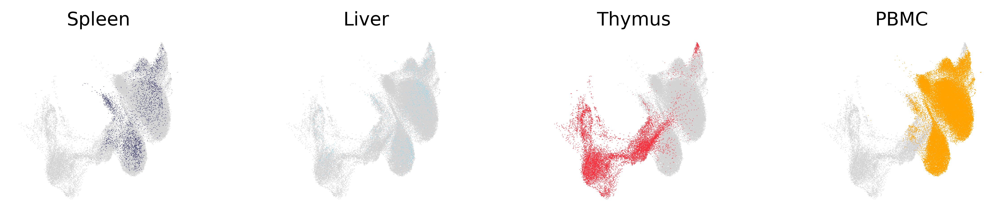

In [51]:
cluster_small_multiples(adata1_IR,"New_Body",size=0.5)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4C_TCR_organ_split.pdf")

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. P

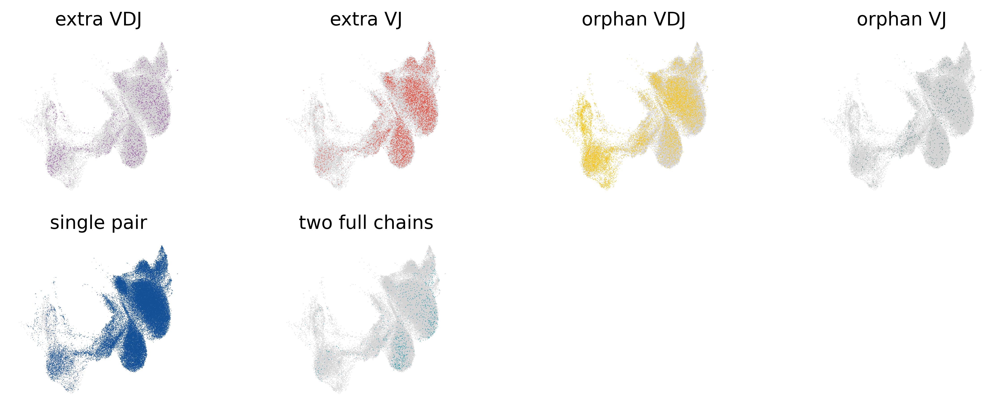

In [52]:
cluster_small_multiples(adata1_IR,"chain_pairing",size=0.5)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4C_TCR_allVDJ_split.pdf")

In [53]:
# adata1_IR[adata1_IR.obs['Last_cell_type'].isin(['MEMP'])].obs_names

In [54]:
# adata16.obs.loc[adata1_IR[adata1_IR.obs['Last_cell_type'].isin(['Others','CD16lowGNLY- NK','CD16highGNLY+ NK','MEMP'])].obs_names,'Last_cell_type']='Naïve CD8 T'

In [55]:
# adata16.write_h5ad('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad')

In [56]:
# adata1_IR.obs['Last_cell_type']=='Others'

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


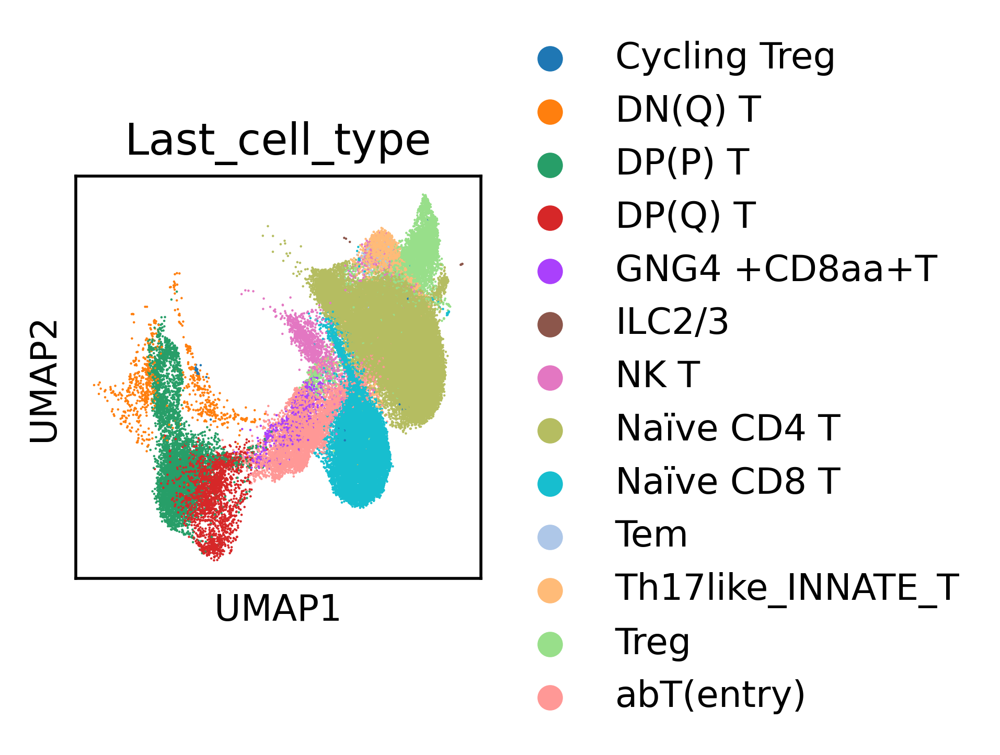

In [55]:
sc.pl.umap(adata1_IR, color="Last_cell_type")

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


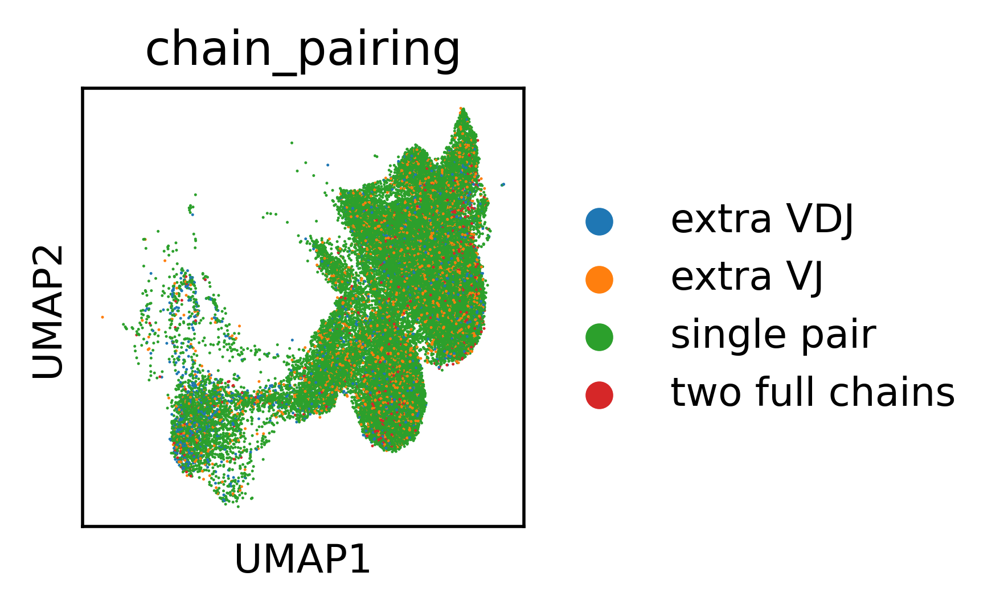

In [56]:
sc.pl.umap(adata, color="chain_pairing")

In [57]:
adata1.obs["chain_pairing"].value_counts()

no IR              174399
single pair         48862
orphan VDJ          12406
extra VJ             5925
extra VDJ            2488
two full chains      1026
orphan VJ             728
Name: chain_pairing, dtype: int64

In [58]:
ir.pp.ir_dist(adata_tcr2, sequence="nt")
ir.pp.ir_dist(adata1_IR, sequence="nt")
ir.pp.ir_dist(adata, sequence="nt")

Computing sequence x sequence distance matrix for VJ sequences.
Computing sequence x sequence distance matrix for VDJ sequences.
Computing sequence x sequence distance matrix for VJ sequences.
Computing sequence x sequence distance matrix for VDJ sequences.
Computing sequence x sequence distance matrix for VJ sequences.
Computing sequence x sequence distance matrix for VDJ sequences.


In [59]:
ir.tl.define_clonotypes(adata_tcr2, receptor_arms="all", dual_ir="primary_only")

Initializing lookup tables. 
Computing clonotype x clonotype distances.
NB: Computation happens in chunks. The progressbar only advances when a chunk has finished. 


  0%|          | 0/76893 [00:01<?, ?it/s]

Stored clonal assignments in `adata.obs["clone_id"]`.


In [60]:
ir.tl.define_clonotypes(adata, receptor_arms="all", dual_ir="primary_only")

Initializing lookup tables. 
Computing clonotype x clonotype distances.
NB: Computation happens in chunks. The progressbar only advances when a chunk has finished. 


  0%|          | 0/57960 [00:00<?, ?it/s]

Stored clonal assignments in `adata.obs["clone_id"]`.


In [63]:
# ir.tl.define_clonotypes(adata1_IR, receptor_arms="all", dual_ir="primary_only")

In [61]:
ir.tl.clonotype_network(adata, min_cells=2)

<Axes: >

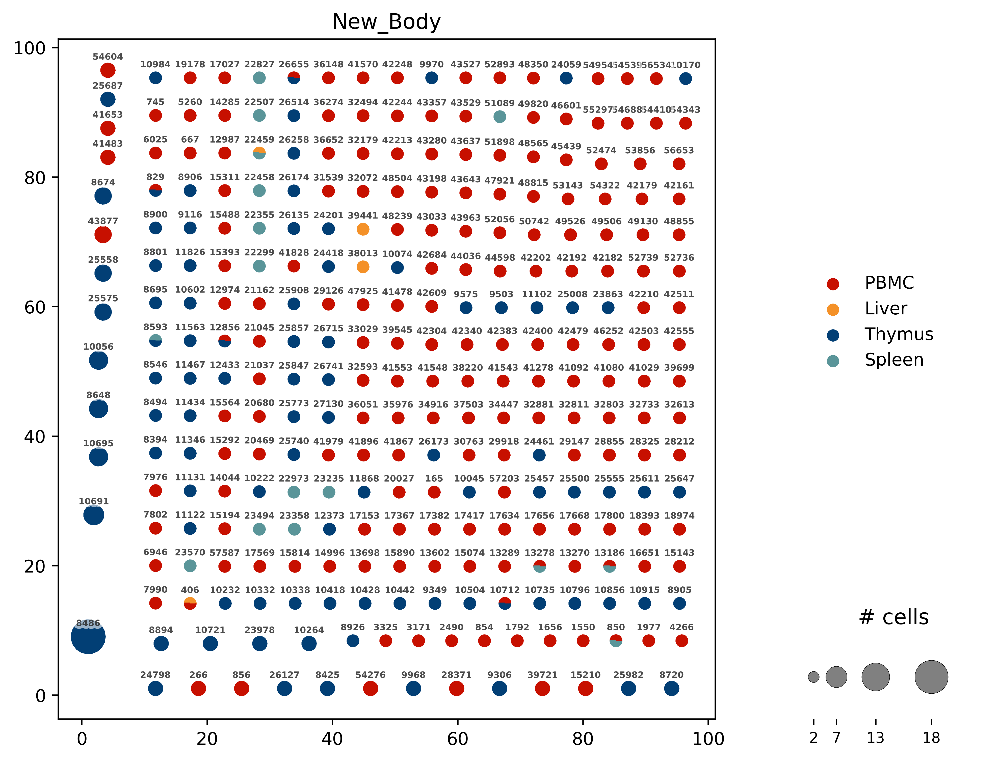

In [62]:
ir.pl.clonotype_network(
    adata, color="New_Body", base_size=20, label_fontsize=5, panel_size=(7, 7)
)

<Axes: >

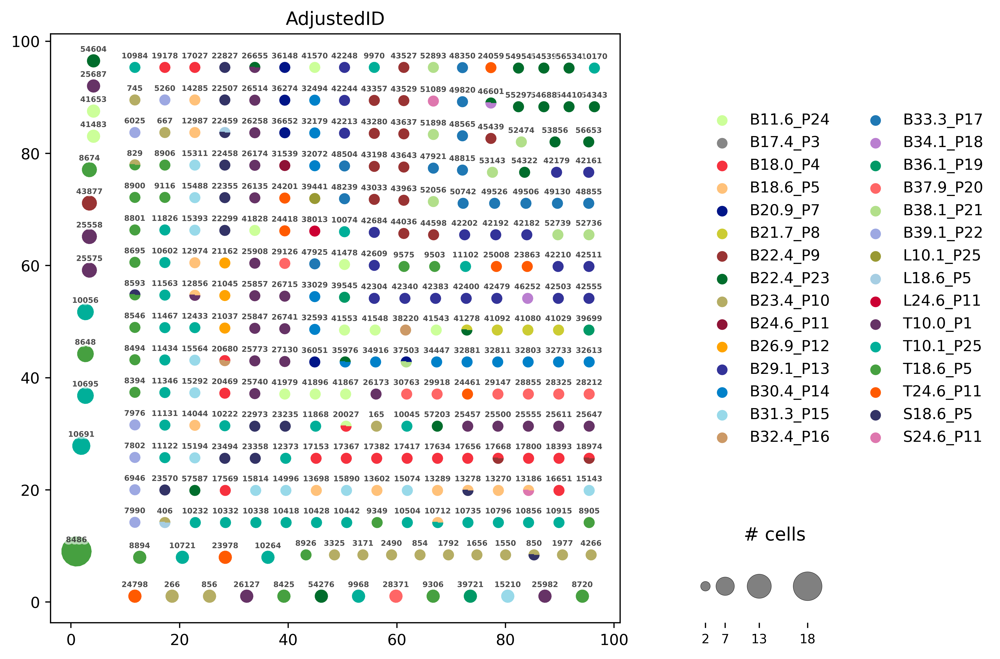

In [63]:
ir.pl.clonotype_network(
    adata, color="AdjustedID", base_size=20, label_fontsize=5, panel_size=(7, 7)
)

In [64]:
ir.tl.chain_qc(adata)

In [65]:
ir.pp.ir_dist(
    adata,
    metric="alignment",
    sequence="aa",
    cutoff=15,
)

Computing sequence x sequence distance matrix for VJ sequences.


  0%|          | 0/355746 [00:00<?, ?it/s]

Computing sequence x sequence distance matrix for VDJ sequences.


  0%|          | 0/441330 [00:00<?, ?it/s]

In [66]:
ir.tl.define_clonotype_clusters(
    adata,
    sequence="aa",
    metric="alignment",
    receptor_arms="all",
    dual_ir="any",
    same_v_gene=True,
    key_added="cc_aa_alignment_same_v",
)

Initializing lookup tables. 
Computing clonotype x clonotype distances.
NB: Computation happens in chunks. The progressbar only advances when a chunk has finished. 


  0%|          | 0/58007 [00:00<?, ?it/s]

Stored clonal assignments in `adata.obs["cc_aa_alignment_same_v"]`.


In [67]:
ir.tl.clonal_expansion(adata)

In [70]:
create_palette(adata.obs["clonal_expansion"].unique(),colorname2)

{'1': '#868686', '2': '#B5AD64', '>= 3': '#9DA8E2'}

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


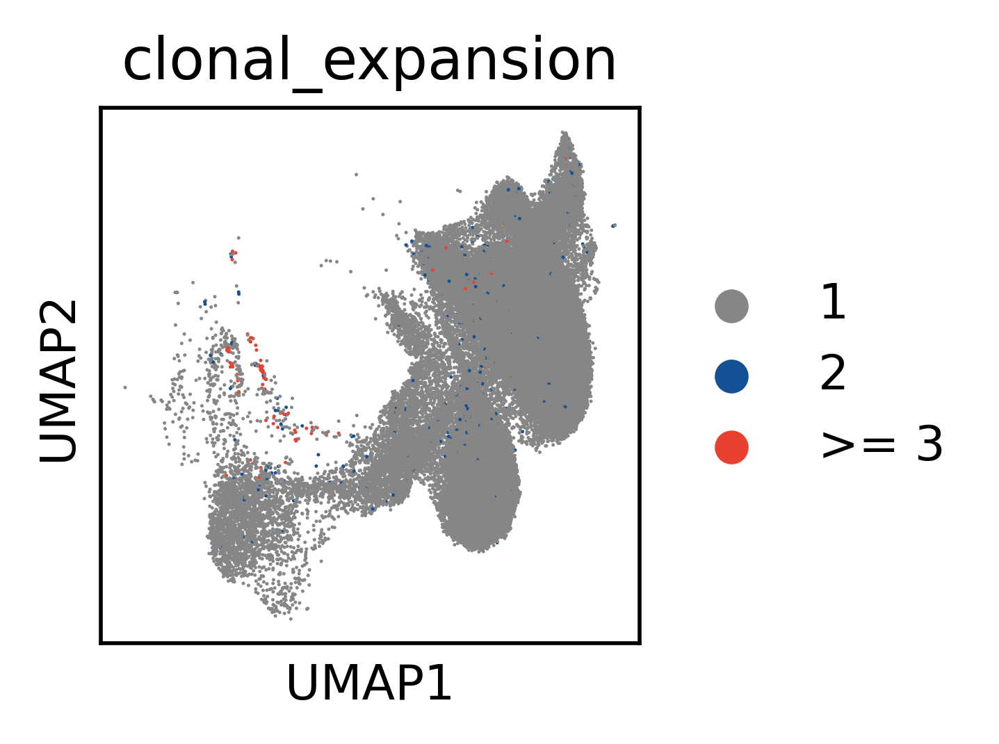

In [74]:

sc.pl.umap(adata, color=["clonal_expansion"],palette={'1': '#868686', '2': '#145096', '>= 3': '#e9412f'},show=False)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4_TCR_clonal_expansion.pdf",bbox_inches='tight')

In [ ]:
{'1': '#868686', '2': '#B5AD64', '>= 3': '#9DA8E2'}

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


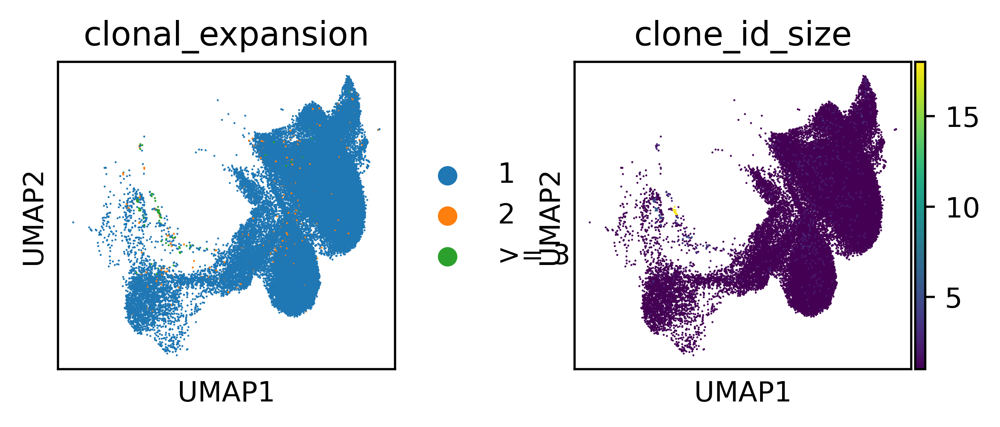

In [68]:

sc.pl.umap(adata, color=["clonal_expansion", "clone_id_size"])

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


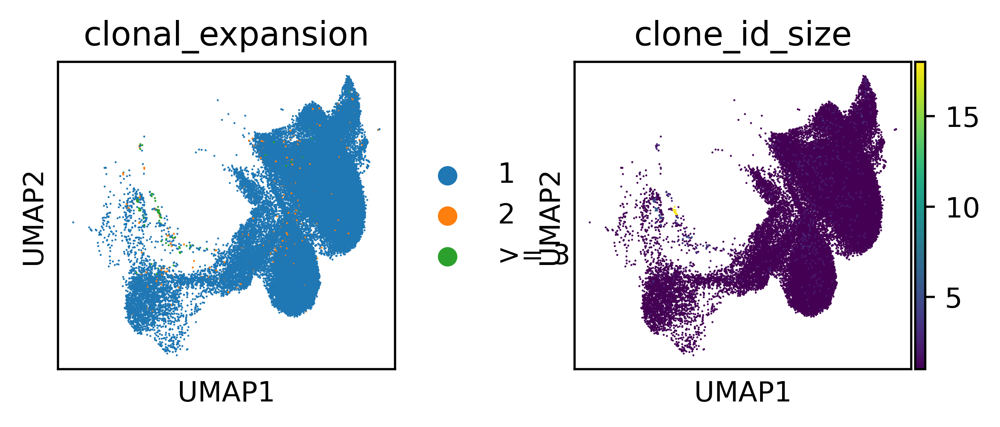

In [71]:

sc.pl.umap(adata, color=["clonal_expansion", "clone_id_size"])

In [72]:
import matplotlib.pyplot as plt

# 打印所有内置的colormaps
print(plt.colormaps())

['magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges', 'PRGn', 'PiYG', 'PuBu', 'PuBuGn', 'PuOr', 'PuRd', 'Purples', 'RdBu', 'RdGy', 'RdPu', 'RdYlBu', 'RdYlGn', 'Reds', 'Spectral', 'Wistia', 'YlGn', 'YlGnBu', 'YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary', 'bone', 'brg', 'bwr', 'cool', 'coolwarm', 'copper', 'cubehelix', 'flag', 'gist_earth', 'gist_gray', 'gist_heat', 'gist_ncar', 'gist_rainbow', 'gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray', 'hot', 'hsv', 'jet', 'nipy_spectral', 'ocean', 'pink', 'prism', 'rainbow', 'seismic', 'spring', 'summer', 'terrain', 'winter', 'Accent', 'Dark2', 'Paired', 'Pastel1', 'Pastel2', 'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b', 'tab20c', 'magma_r', 'inferno_r', 'plasma_r', 'viridis_r', 'cividis_r', 'twilight_r', 'twilight_shifted_r', 'turbo_r', 'Blues_r', 'BrBG_r', 'BuGn_r', 'BuPu_r', 'CMRmap_r', 'GnBu_r', 'G

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


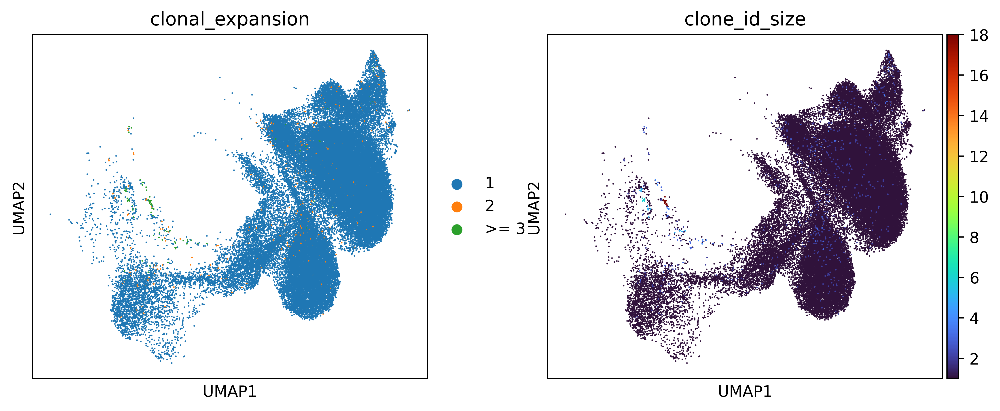

In [73]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4.5, 4]
plt.rcParams['figure.dpi'] = 250
sc.pl.umap(adata, color=["clonal_expansion", "clone_id_size"],show=False,cmap= 'turbo',size=4)
plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28C_clone_id_size.pdf")

<Axes: title={'center': 'Fraction of Last_cell_type in each clone_id'}, xlabel='clone_id', ylabel='Fraction of cells in AdjustedID'>

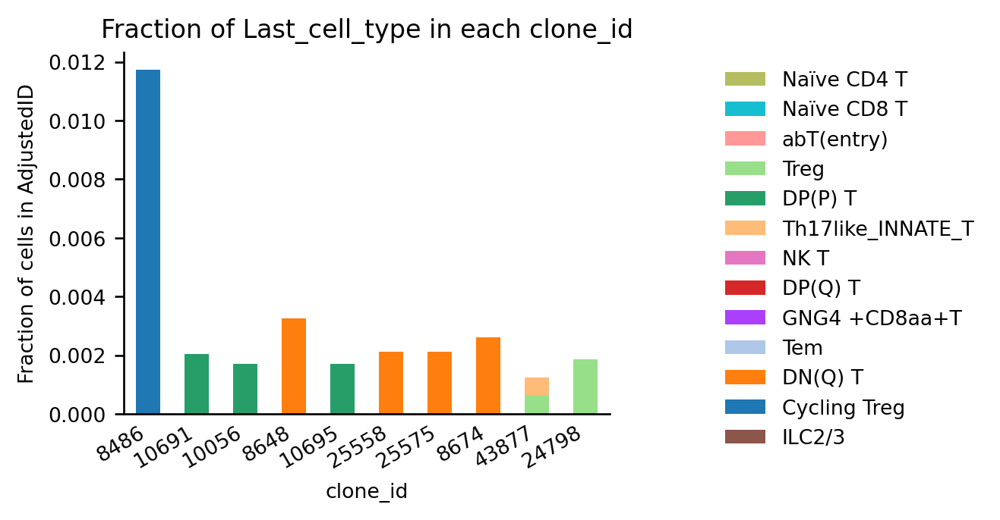

In [74]:
ir.pl.group_abundance(
    adata, groupby="clone_id", target_col="Last_cell_type", max_cols=10, normalize="AdjustedID"
)

In [130]:
adata.obs.to_csv("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Data/TCRmeta.csv")

<Axes: title={'center': 'Fraction of Last_cell_type in each clone_id'}, xlabel='clone_id', ylabel='Fraction of cells in AdjustedID'>

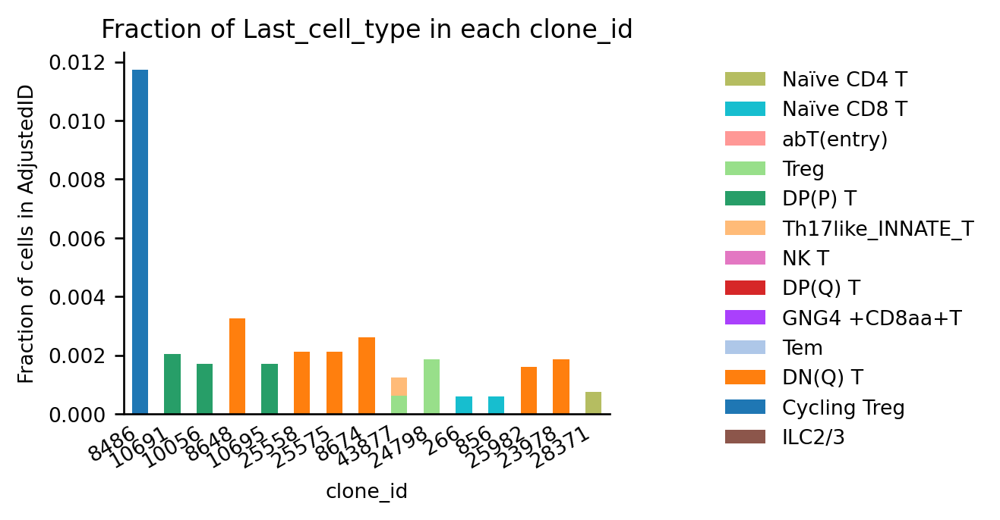

In [75]:
ir.pl.group_abundance(
    adata, groupby="clone_id", target_col="Last_cell_type", max_cols=15, normalize="AdjustedID"
)

<Axes: title={'center': 'Number of cells in clone_id by Last_cell_type'}, xlabel='clone_id', ylabel='Number of cells'>

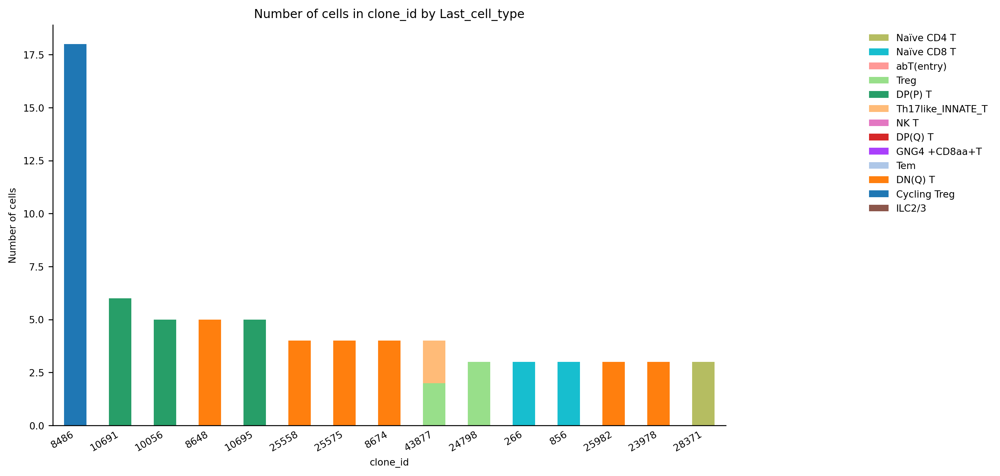

In [76]:
ir.pl.group_abundance(adata, groupby="clone_id", target_col="Last_cell_type", max_cols=15,figsize=[10, 6])

In [77]:
clone_id_abundance = ir.tl.group_abundance(adata, groupby="clone_id", target_col="Last_cell_type",  sort='count')

In [78]:
coloneid15=clone_id_abundance.iloc[:15, :]
coloneid15
# abundance = abundance.iloc[:max_cols, :]

Last_cell_type,Naïve CD4 T,Naïve CD8 T,abT(entry),Treg,DP(P) T,Th17like_INNATE_T,NK T,DP(Q) T,GNG4 +CD8aa+T,Tem,DN(Q) T,Cycling Treg,ILC2/3
clone_id,,,,,,,,,,,,,
8486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,0.0
10691,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10056,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0
10695,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25558,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
25575,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
8674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
43877,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [79]:
coloneid15_reset_index = coloneid15.reset_index().rename(columns={'clone_id': 'clone_id'})

coloneid15_melted =coloneid15_reset_index.melt(id_vars=['clone_id'])

print(coloneid15_melted )

    clone_id Last_cell_type  value
0       8486    Naïve CD4 T    0.0
1      10691    Naïve CD4 T    0.0
2      10056    Naïve CD4 T    0.0
3       8648    Naïve CD4 T    0.0
4      10695    Naïve CD4 T    0.0
..       ...            ...    ...
190      266         ILC2/3    0.0
191      856         ILC2/3    0.0
192    25982         ILC2/3    0.0
193    23978         ILC2/3    0.0
194    28371         ILC2/3    0.0

[195 rows x 3 columns]


In [80]:
%%R
file_path <- "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/ColorDict/Celltype_colors_dict_nonum.json"
library(jsonlite)
colors_vector <- fromJSON(file_path) 
colorname2=c("#46A040","#00AF99" ,"#98D9E9" ,"#F6313E", "#FFA300","#2f2f2f",  "#FFC179", 
"#FF5A00", "#663366","#FF6666","#8F1336", "#0081C9", "#001588", "#CC0033",
"#CC9966","#CC0033","#999933","#009966","#CCCC33","#CCFF99","#0eb0c8","#993333","#333366",
"#490C65", "#BA7FD0","#A6CEE3", "#1F78B4", "#DE77AE", "#B2DF8A", "#006D2C", "#B5AD64",
"#9DA8E2","#91C392", "#194a55", "#187c65", "#c29f62","#f49128","#c62d17", "#333329",
"#023f75", "#ea894e", "#266b69",  "#e1abbc","#f6c619","#fa6e01", "#972b1d", "#e6a84b", "#4c211b", "#ff717f","#223e9c", 
"#aebea6", "#edae11", "#c74732", "#6a73cf", "#edd064" , 
"#0eb0c8", "#f2ccac" ,"#868686","#339966", "#83ba9e", "#b12b23", "#0f6657","#f26115","#eb4601")
colorname3=colorname2

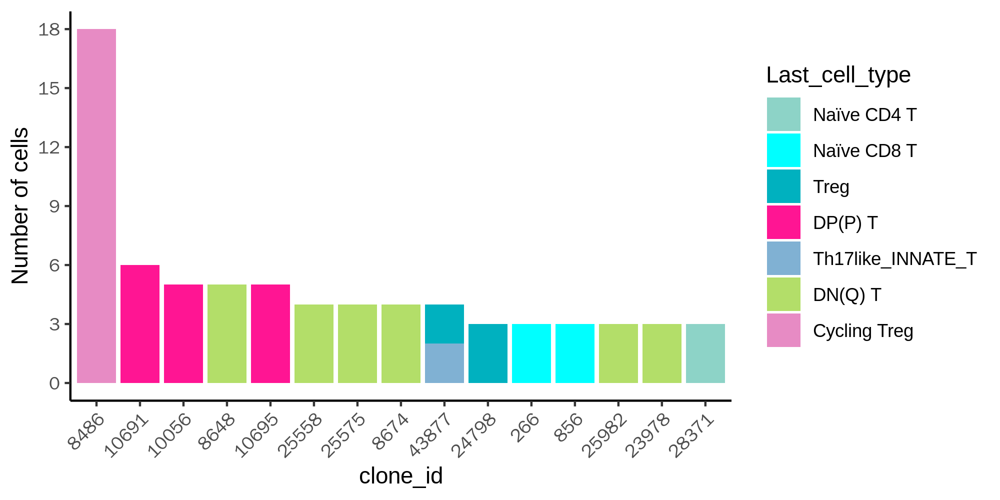

In [81]:
%%R -i coloneid15_melted -i coloneid15 -w 2000 -h 1000 -r 300
library(jsonlite)
file_path <- "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/ColorDict/Celltype_colors_dict_nonum.json"

colors_vector <- fromJSON(file_path) 
coloneid15_melted2<- coloneid15_melted[ !coloneid15_melted$value==0,]
coloneid15_melted2$clone_id<-factor(coloneid15_melted2$clone_id,level=rownames(coloneid15)) 

coloneid15_melted2$Last_cell_type<-factor(coloneid15_melted2$Last_cell_type,level=unique(coloneid15_melted2$Last_cell_type))
ggplot(coloneid15_melted2 )+geom_col(aes(x=clone_id,y=value,fill=Last_cell_type),position='stack')+
theme_classic()+theme(
    axis.text.x = element_text(angle = 45, hjust = 1)
  ) +scale_fill_manual(values =color5 ) +scale_y_continuous(breaks=seq(0,20, by=3))+
ylab('Number of cells')

Saving 6.67 x 3.33 in image


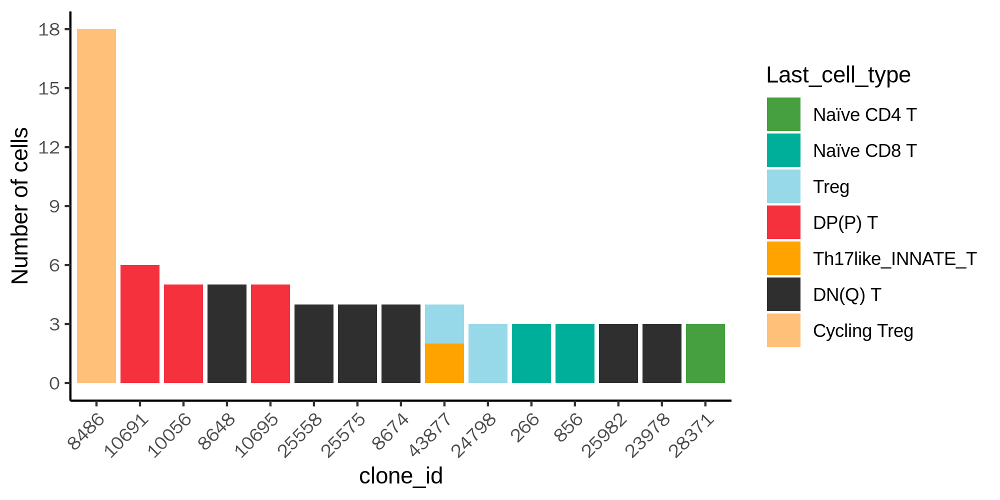

In [82]:
%%R -i coloneid15_melted -i coloneid15 -w 2000 -h 1000 -r 300
CloneID_plot <- function(melted_df, original_df, file_path, color_values, cell_type_var = "Last_cell_type") {
    library(jsonlite)
    library(ggplot2)

    colors_vector <- fromJSON(file_path)
    melted_df2 <- melted_df[!melted_df$value == 0, ]
    melted_df2$clone_id <- factor(melted_df2$clone_id, level = rownames(original_df))
    melted_df2[[cell_type_var]] <- factor(melted_df2[[cell_type_var]], level = unique(melted_df2[[cell_type_var]]))

    plot <- ggplot(melted_df2) +
        geom_col(aes_string(x = "clone_id", y = "value", fill = cell_type_var), position = 'stack') +
        theme_classic() +
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
        scale_fill_manual(values = colorname2) +
        scale_y_continuous(breaks = seq(0, 20, by = 3)) +
        ylab('Number of cells')

    return(plot)
}

plot <-CloneID_plot(coloneid15_melted, coloneid15, "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/ColorDict/Celltype_colors_dict_nonum.json", colorname2[4:10])
print(plot)
ggsave("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28D_clone_id.pdf")

In [83]:
AdjustedID_bun=ir.tl.group_abundance(adata, groupby="clone_id", target_col="AdjustedID")

In [84]:
AdjustedID_abundance = ir.tl.group_abundance(adata, groupby="clone_id", target_col="AdjustedID",  sort='count')

In [85]:
AdjustedID_abundance15=AdjustedID_abundance.iloc[:15, :]
AdjustedID_abundance15
# abundance = abundance.iloc[:max_cols, :]

AdjustedID,B23.4_P10,B18.0_P4,B30.4_P14,B22.4_P23,B37.9_P20,B33.3_P17,B22.4_P9,B39.1_P22,T10.1_P25,B18.6_P5,...,B34.1_P18,S24.6_P11,B11.6_P24,B29.1_P13,L18.6_P5,B24.6_P11,B21.7_P8,L24.6_P11,B17.4_P3,L10.1_P25
clone_id,,,,,,,,,,,,,,,,,,,,,
8486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10691,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10695,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25558,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25575,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
43877,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [86]:
AdjustedID_abundance15_index = AdjustedID_abundance15.reset_index().rename(columns={'clone_id': 'clone_id'})

AdjustedID_abundance15_melted = AdjustedID_abundance15_index.melt(id_vars=['clone_id'])

print(AdjustedID_abundance15_melted )

    clone_id AdjustedID  value
0       8486  B23.4_P10    0.0
1      10691  B23.4_P10    0.0
2      10056  B23.4_P10    0.0
3       8648  B23.4_P10    0.0
4      10695  B23.4_P10    0.0
..       ...        ...    ...
445      266  L10.1_P25    0.0
446      856  L10.1_P25    0.0
447    25982  L10.1_P25    0.0
448    23978  L10.1_P25    0.0
449    28371  L10.1_P25    0.0

[450 rows x 3 columns]


In [87]:
%%R

CloneID_plot2 <- function(melted_df2, color_values) {
    plot <- ggplot(melted_df2) +
        geom_col(aes_string(x = "clone_id", y = "value", fill = cell_type_var), position = 'stack') +
        theme_classic() +
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
        scale_fill_manual(values = color_values) +
        scale_y_continuous(breaks = seq(0, 20, by = 3)) +
        ylab('Number of cells')

    return(plot)
}



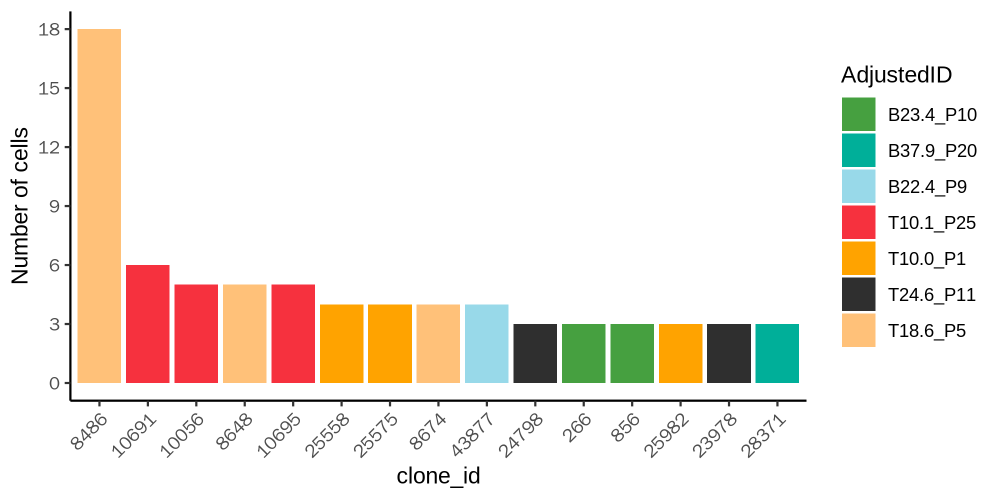

In [88]:
%%R -i AdjustedID_abundance15_melted -i AdjustedID_abundance15 -w 2000 -h 1000 -r 300
plot <-CloneID_plot(AdjustedID_abundance15_melted, 
                    AdjustedID_abundance15, 
                    "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/ColorDict/Celltype_colors_dict_nonum.json", 
                    colorname2[20:29],
                    'AdjustedID'
                   )
print(plot)

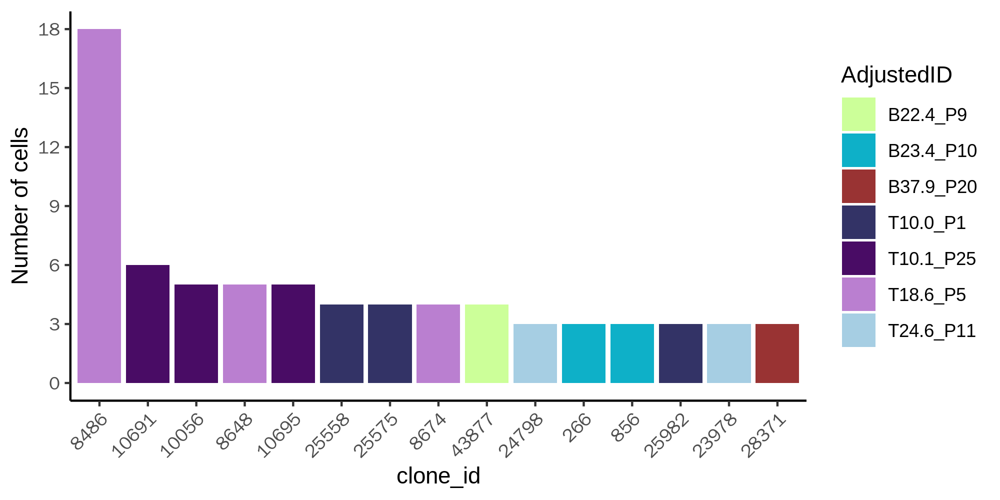

In [89]:
%%R -i AdjustedID_abundance15_melted -i AdjustedID_abundance15 -w 2000 -h 1000 -r 300
AdjustedID_abundance15_melted_df2 <- AdjustedID_abundance15_melted[!AdjustedID_abundance15_melted$value == 0, ]
AdjustedID_abundance15_melted_df2$clone_id <- factor(AdjustedID_abundance15_melted_df2$clone_id, level = rownames(AdjustedID_abundance15))
AdjustedID_abundance15_melted_df2$AdjustedID<-factor(AdjustedID_abundance15_melted_df2$AdjustedID,
                                                     level=
                                                   sort(unique(AdjustedID_abundance15_melted_df2$AdjustedID)) )

AdjustedID_abundance15_melted_df2

ggplot(AdjustedID_abundance15_melted_df2) +
        geom_col(aes_string(x = "clone_id", y = "value",
                            fill = "AdjustedID"), position = 'stack') +
        theme_classic() +
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
        scale_fill_manual(values = colorname2[20:29]) +
        scale_y_continuous(breaks = seq(0, 20, by = 3)) +
        ylab('Number of cells')

In [90]:
%%R
AdjustedID_abundance15_melted

# coloneid15_melted
colone15<-merge(AdjustedID_abundance15_melted,coloneid15_melted,by='clone_id')
dim(colone15)

[1] 5850    5


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Saving 12 x 3.33 in image


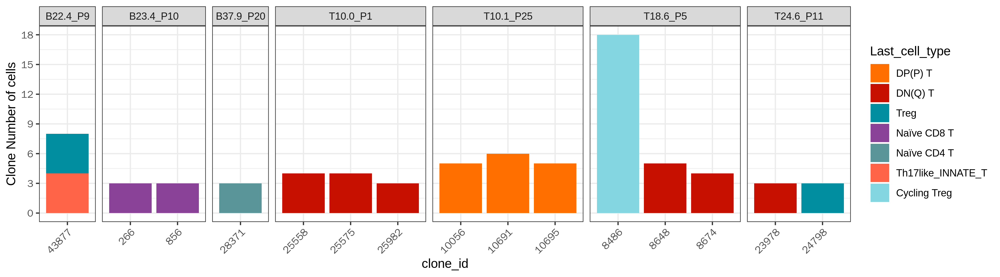

In [91]:
%%R -i AdjustedID_abundance15_melted -i AdjustedID_abundance15 -w 3600 -h 1000 -r 300

colone15<- colone15[!colone15$value.x == 0, ]
colone15<- colone15[!colone15$value.y == 0, ]
colone15$clone_id <- factor(colone15$clone_id, level = unique(colone15$clone_id))
colone15$Last_cell_type<- factor(colone15$Last_cell_type, level = unique(colone15$Last_cell_type))
colone15$AdjustedID<-factor(colone15$AdjustedID,level=
                                                   sort(unique(colone15$AdjustedID)) )
P5=ggplot(colone15) +
        geom_col(aes_string(x = "clone_id", y = "value.x",
                            fill = "Last_cell_type"), position = 'stack') +
        theme_bw() +
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
        scale_fill_manual(values = colname4) +
        scale_y_continuous(breaks = seq(0, 20, by = 3)) +scale_fill_futurama()+
        ylab('Clone Number of cells')+facet_grid(. ~ AdjustedID, space = "free", scales = "free", switch = "y") 
ggsave("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28D_clone_id_organ.pdf")
P5

<Axes: title={'center': 'Spectratype of IR_VJ_1_junction_aa by AdjustedID'}, xlabel='IR_VJ_1_junction_aa length', ylabel='Number of cells'>

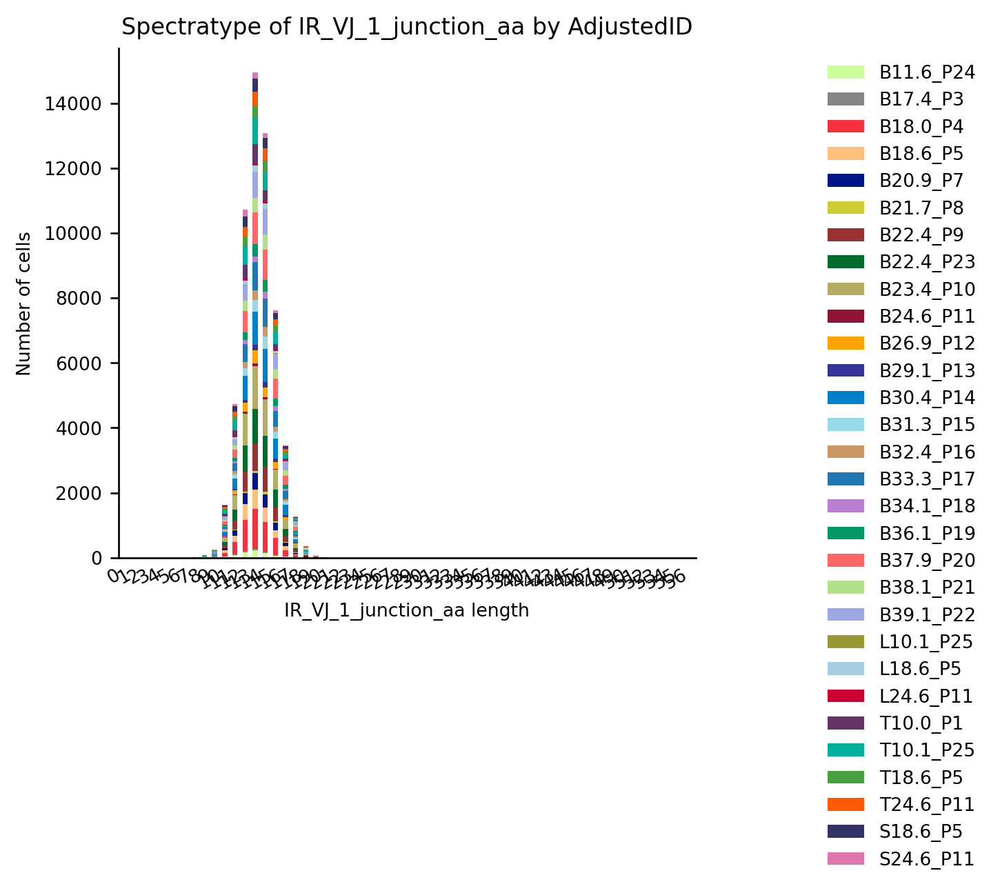

In [92]:
ir.pl.spectratype(adata, color="AdjustedID", viztype="bar", fig_kws={"dpi": 120})

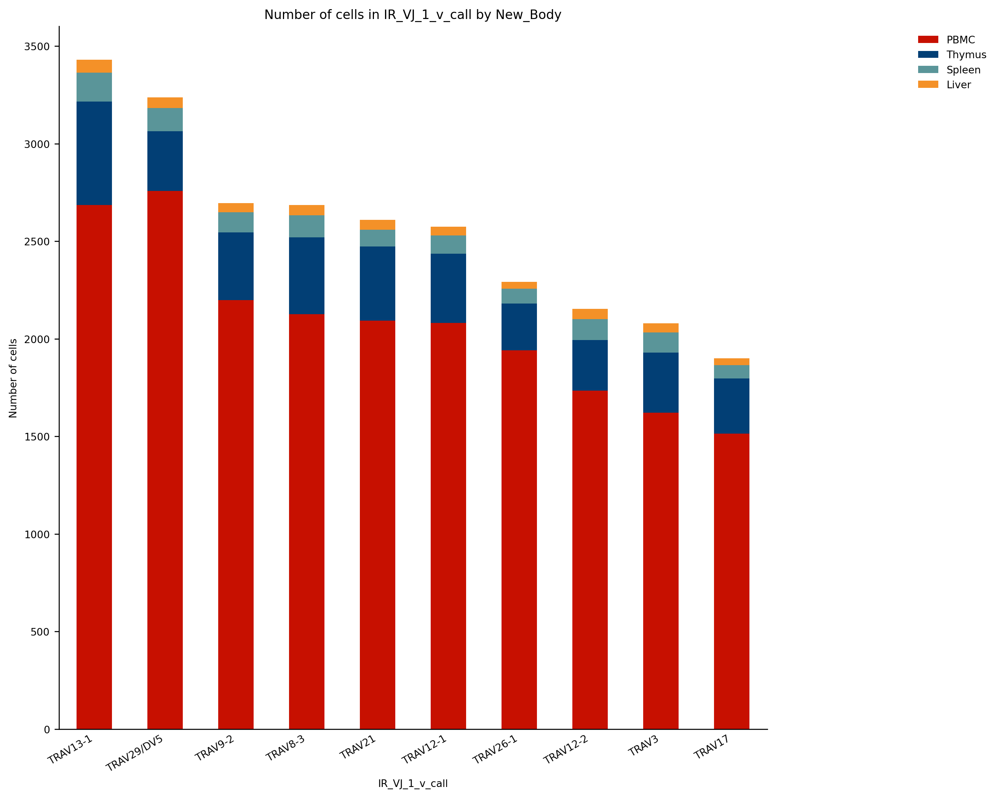

In [93]:
_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VJ_1_v_call",
    target_col="New_Body",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

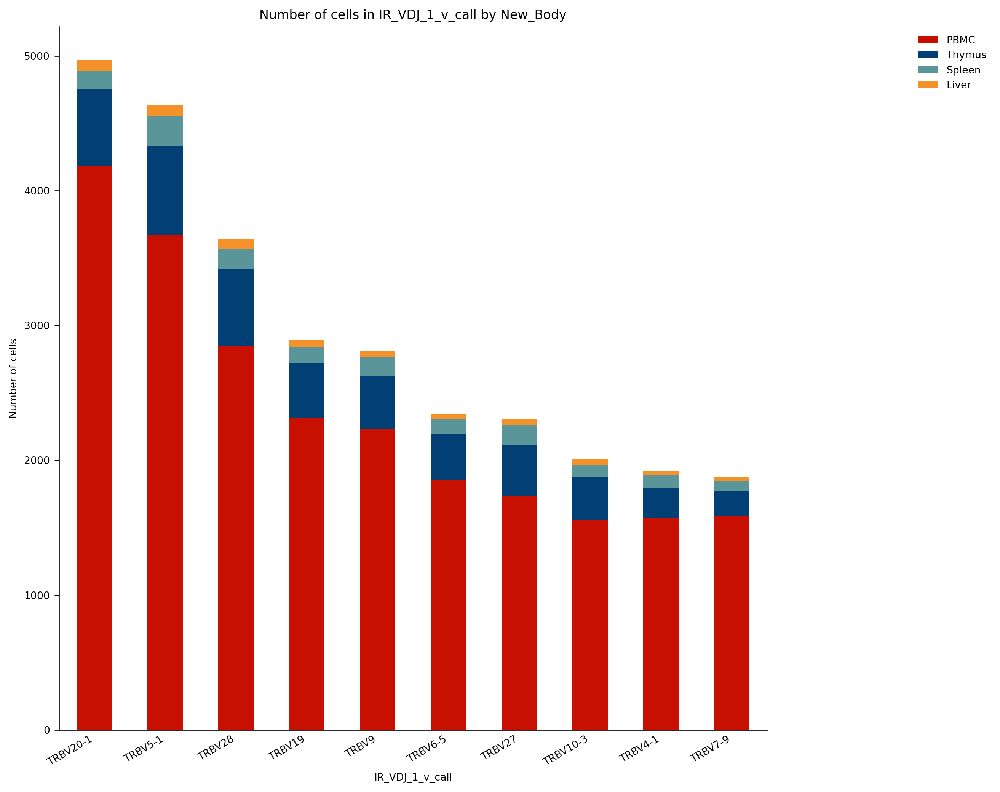

In [94]:
_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VDJ_1_v_call",
    target_col="New_Body",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

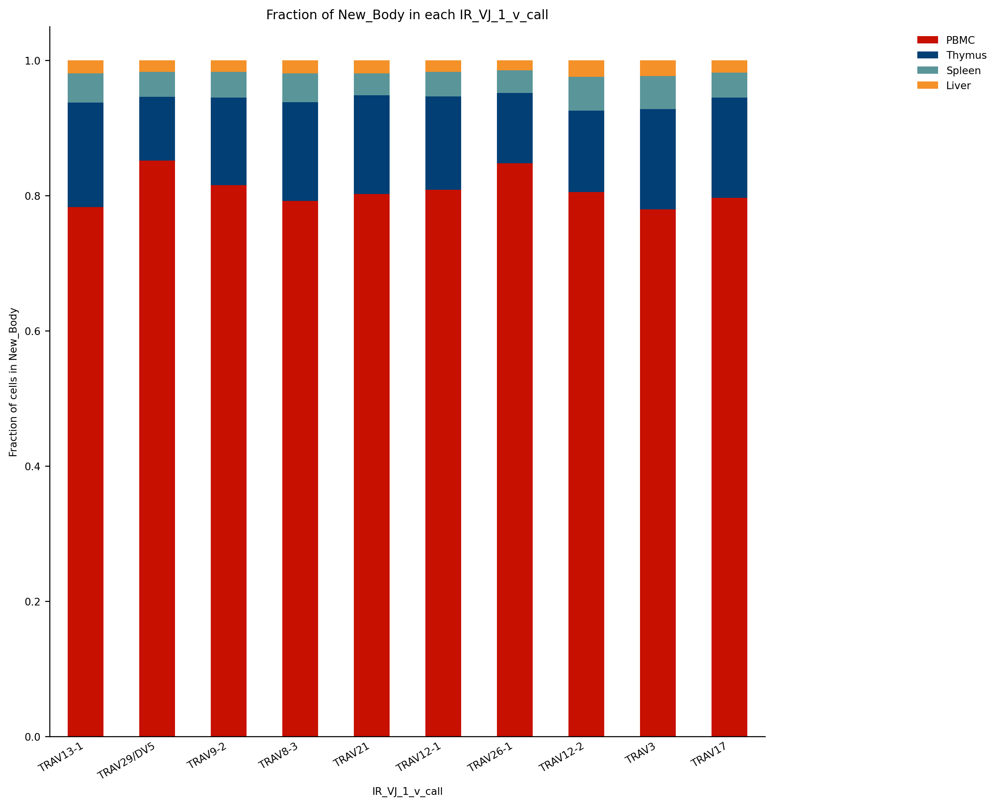

In [95]:
_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VJ_1_v_call",
    target_col="New_Body",
    normalize=True,
    max_cols=10,
    figsize=[10, 10],
)

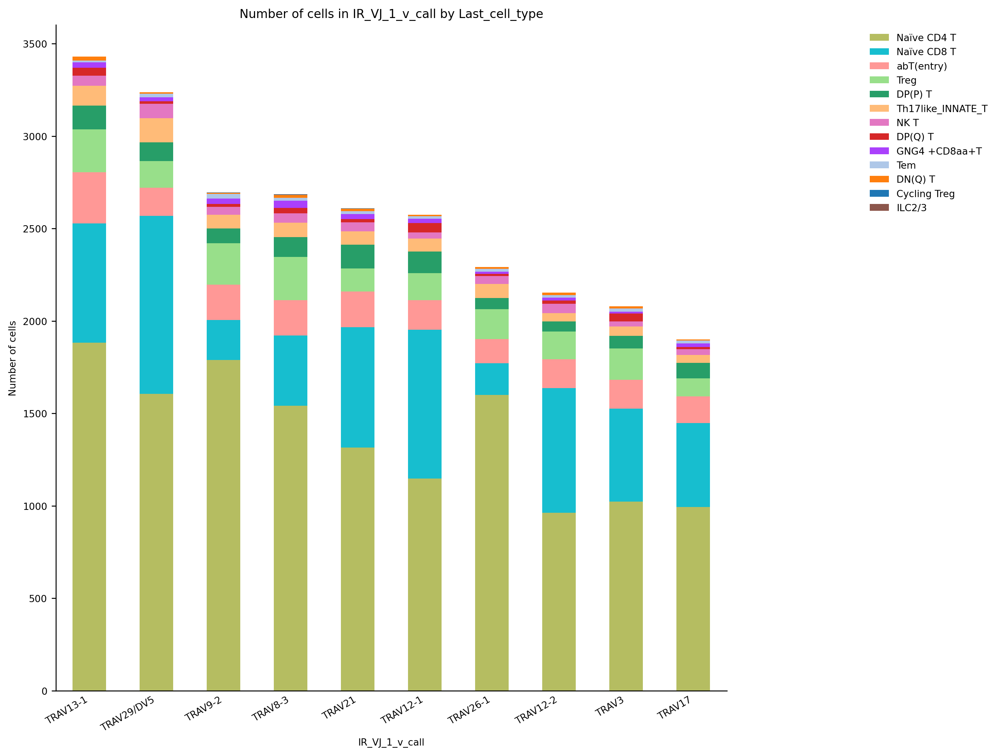

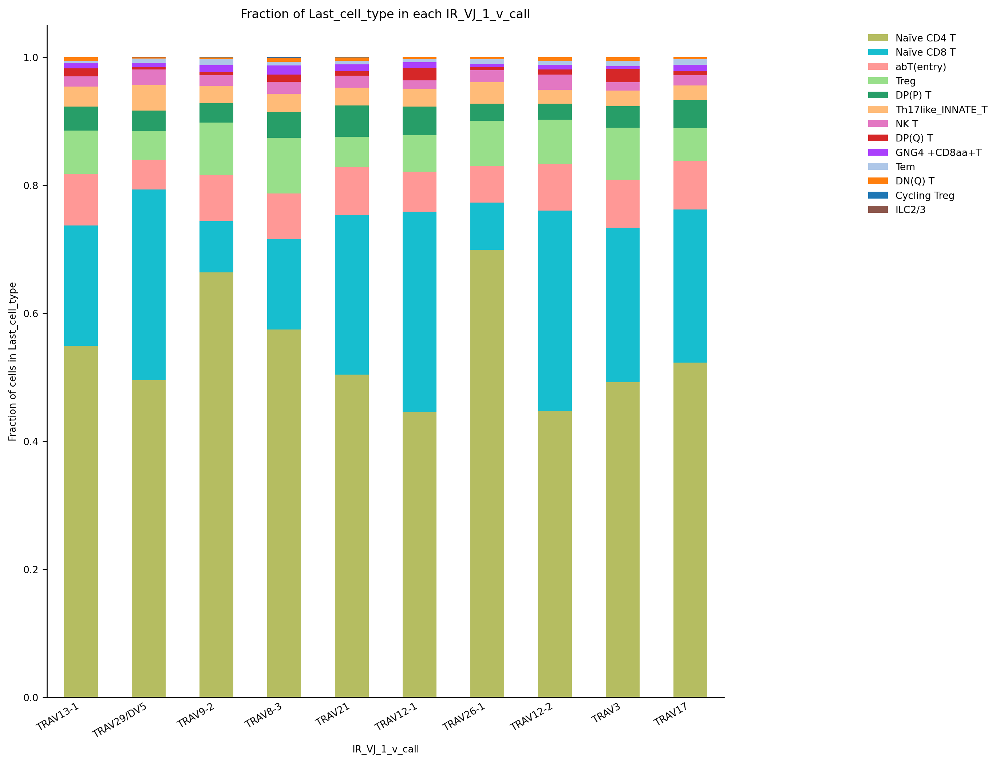

In [96]:
_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VJ_1_v_call",
    target_col="Last_cell_type",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

# Normalized abundances

_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VJ_1_v_call",
    target_col="Last_cell_type",
    normalize=True,
    max_cols=10,
    figsize=[10, 10],
)

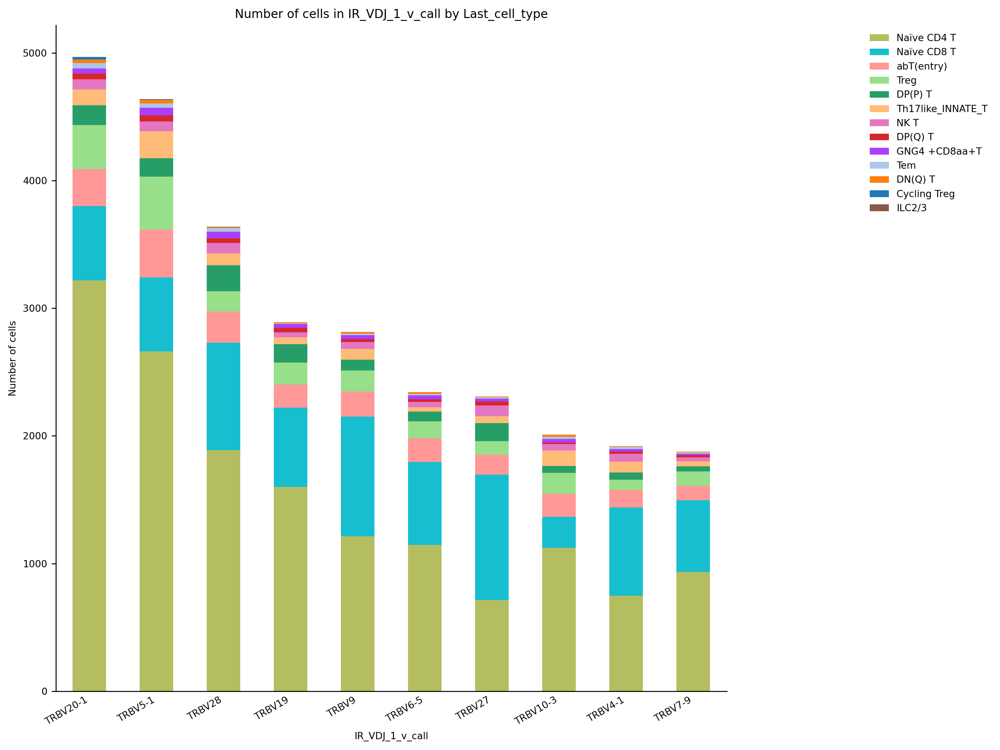

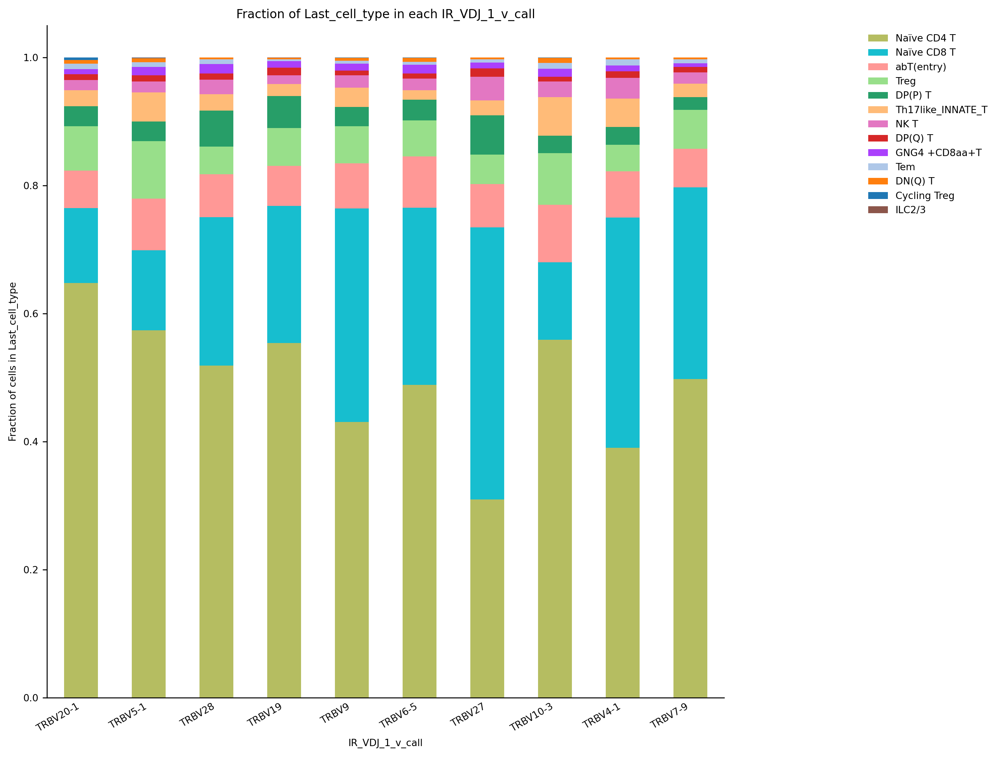

In [97]:
_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VDJ_1_v_call",
    target_col="Last_cell_type",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

# Normalized abundances

_ = ir.pl.group_abundance(
    adata,
    groupby="IR_VDJ_1_v_call",
    target_col="Last_cell_type",
    normalize=True,
    max_cols=10,
    figsize=[10, 10],
)

In [98]:
vdj_cols = (
        "VJ_1_v_call",
        "VJ_1_j_call",
        "VDJ_1_v_call",
        "VDJ_1_d_call",
        "VDJ_1_j_call",
    )

In [99]:
adata

AnnData object with n_obs × n_vars = 58301 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR

<Axes: >

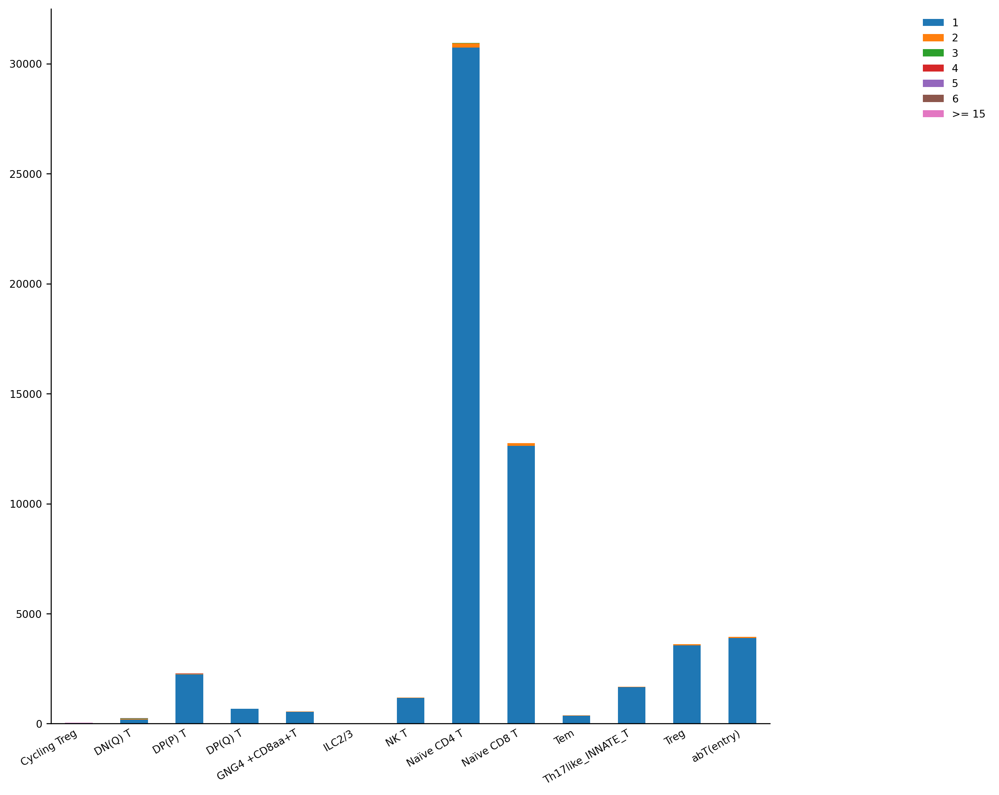

In [100]:
# ir.tl.clonal_expansion(adata, target_col="cc_nt_identity")

ir.pl.clonal_expansion(adata, groupby="Last_cell_type", clip_at=15, normalize=False, figsize=[10, 10],)

In [101]:
adata.obs['OrganCell']=adata.obs['New_Body'].astype('str')+'_'+adata.obs['Last_cell_type'].astype('str')

In [102]:
# tl.summarize_clonal_expansion(
#         params,
#         groupby,
#         target_col=target_col,
#         summarize_by=summarize_by,
#         normalize=normalize,
#         expanded_in=expanded_in,
#         clip_at=clip_at,
#     )

In [103]:
# ir.tl.clonal_expansion(adata, "OrganCell")
AdjustedIDnum=ir.tl.summarize_clonal_expansion(adata, "AdjustedID",clip_at=10,normalize=True)
AdjustedIDnum=AdjustedIDnum.reset_index()

In [104]:
# %%R -i AdjustedIDnum -w 2000 -h 1600 -r 300


Saving 10 x 4 in image


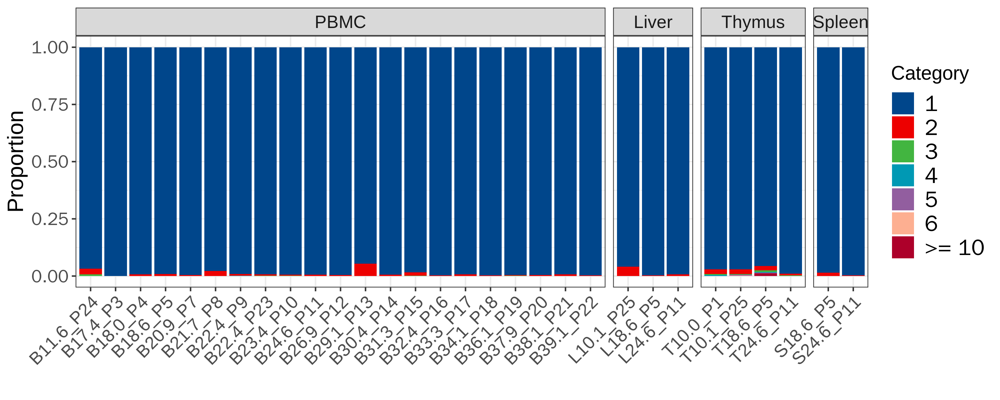

In [105]:
%%R -i AdjustedIDnum -w 3000 -h 1200 -r 300
library(tidyverse)
library(ggplot2)

library(ggsci)
library(reshape2)
AdjustedIDnum$Organ<-substring(AdjustedIDnum$AdjustedID,1,1)
AdjustedIDnum_long<-melt(AdjustedIDnum,id.vars=c('AdjustedID','Organ'))
head(AdjustedIDnum_long)

AdjustedIDnum_long$Organ <- factor(AdjustedIDnum_long$Organ, level=c('B','L','T','S'),label = c('PBMC', 'Liver', 'Thymus', 'Spleen'))
  
P7=ggplot(AdjustedIDnum_long, aes(x = AdjustedID, y = value, fill = variable)) +
    geom_col() +
    labs(x = "Tissue", y = "Proportion", fill = "Category") +
  theme_bw()+ 
    xlab('') +
    theme(text = element_text(size = 16),
          legend.position = "right",
          legend.title = element_text(size = 14),
          legend.text = element_text(size = 16),
          axis.text.x=element_text(angle=45,hjust=1))+
facet_grid(.~ Organ, space = "free", scales = "free", switch = "y") +
    scale_fill_lancet()

ggsave("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4J_TCRclone_organ_split.pdf")
# plot_proportions(testabundance, "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TCRF1.pdf")
P7

<Axes: >

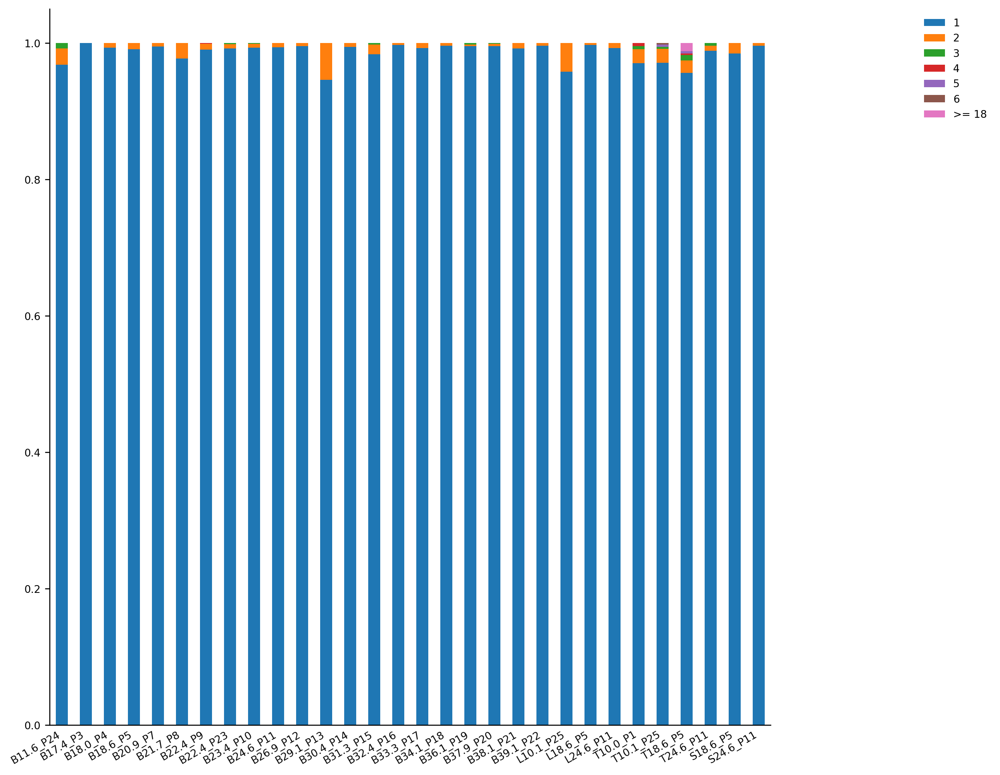

In [106]:
ir.pl.clonal_expansion(adata, "AdjustedID",clip_at=18, figsize=[10, 10])

<Axes: >

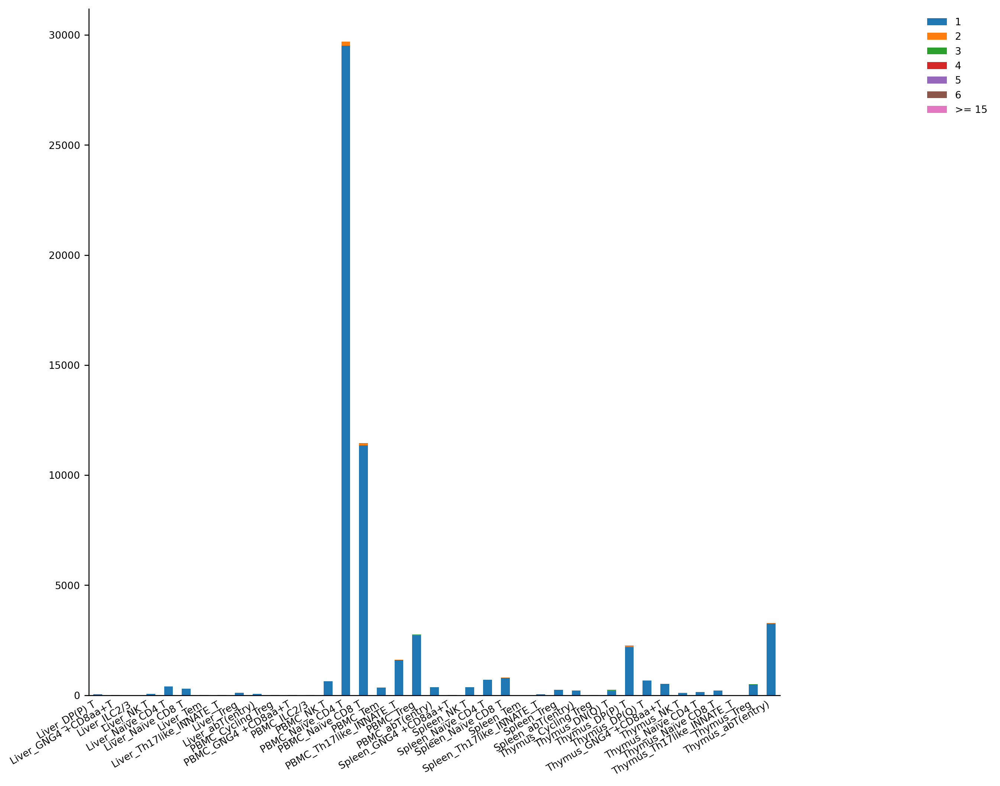

In [107]:
ir.pl.clonal_expansion(adata, groupby="OrganCell", clip_at=15, normalize=False, figsize=[10, 10],)

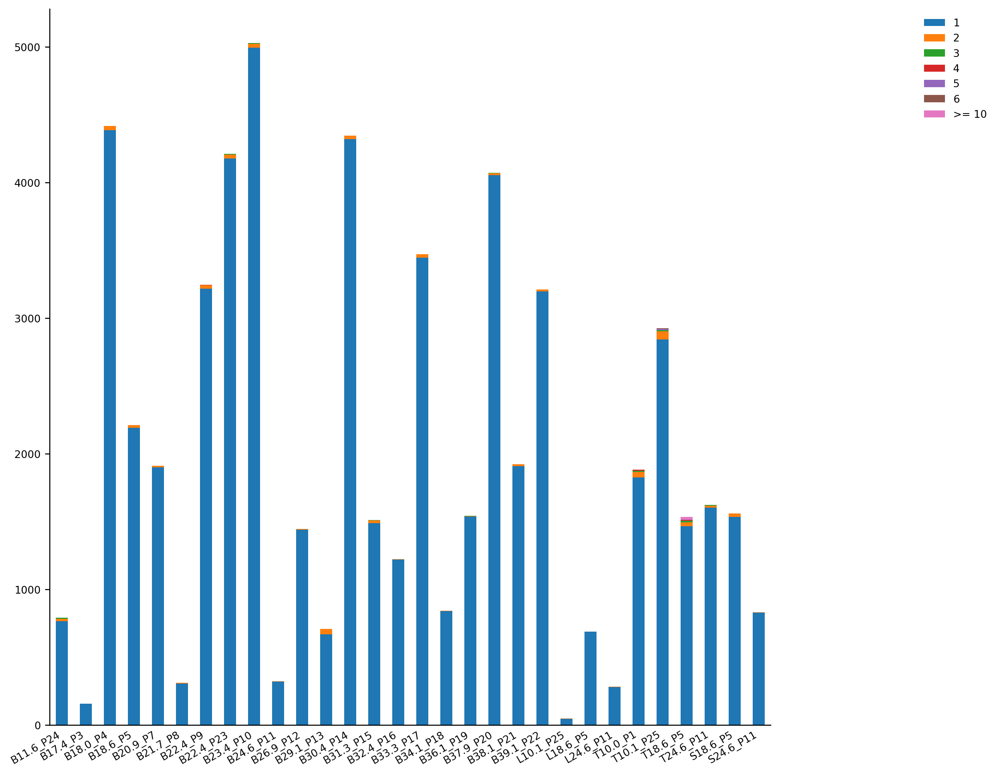

In [108]:
# ir.tl.clonal_expansion(adata1_IR, target_col="cc_aa_identity")

_ = ir.pl.clonal_expansion(
    adata,
    groupby="AdjustedID",
#     target_col="cc_aa_identity",
    clip_at=10,
    normalize=False,
    figsize=[10, 10],
)

In [109]:
# _test1

In [110]:
# ir.tl.clonal_expansion(adata, "OrganCell")
AdjustedIDnum2=ir.tl.summarize_clonal_expansion(adata, "AdjustedID",clip_at=10,normalize=False)
AdjustedIDnum2=AdjustedIDnum2.reset_index()
AdjustedIDnum2

clone_id_clipped_count,AdjustedID,1,2,3,4,5,6,>= 10
0,B11.6_P24,766.0,19.0,6.0,0.0,0.0,0.0,0.0
1,B17.4_P3,158.0,0.0,0.0,0.0,0.0,0.0,0.0
2,B18.0_P4,4387.0,30.0,0.0,0.0,0.0,0.0,0.0
3,B18.6_P5,2191.0,20.0,0.0,0.0,0.0,0.0,0.0
4,B20.9_P7,1902.0,9.0,0.0,0.0,0.0,0.0,0.0
5,B21.7_P8,306.0,7.0,0.0,0.0,0.0,0.0,0.0
6,B22.4_P9,3218.0,26.0,0.0,4.0,0.0,0.0,0.0
7,B22.4_P23,4178.0,28.0,6.0,0.0,0.0,0.0,0.0
8,B23.4_P10,4996.0,27.0,6.0,0.0,0.0,0.0,0.0
9,B24.6_P11,322.0,2.0,0.0,0.0,0.0,0.0,0.0


In [111]:
mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S29/

Saving 10.7 x 4 in image


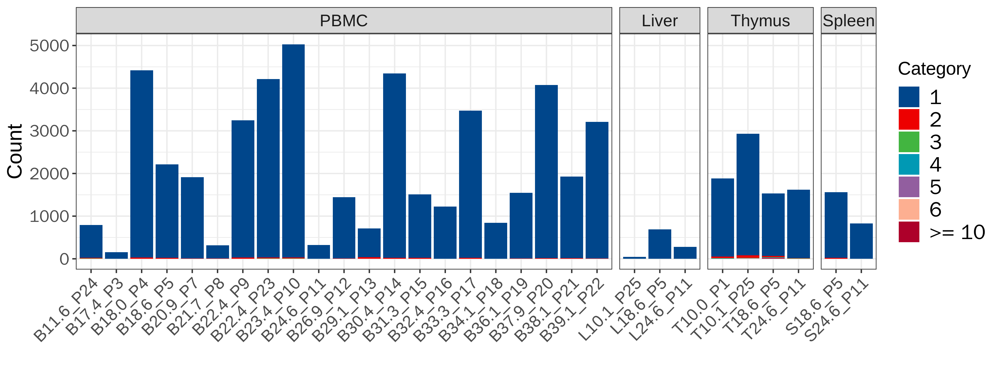

In [112]:
%%R -i AdjustedIDnum2 -w 3200 -h 1200 -r 300
library(tidyverse)
library(ggplot2)

library(ggsci)
library(reshape2)
AdjustedIDnum2$Organ<-substring(AdjustedIDnum2$AdjustedID,1,1)
AdjustedIDnum2_long<-melt(AdjustedIDnum2,id.vars=c('AdjustedID','Organ'))
head(AdjustedIDnum2_long)

AdjustedIDnum2_long$Organ <- factor(AdjustedIDnum2_long$Organ, level=c('B','L','T','S'),label = c('PBMC', 'Liver', 'Thymus', 'Spleen'))
  
P8=ggplot(AdjustedIDnum2_long, aes(x = AdjustedID, y = value, fill = variable)) +
    geom_col() +
    labs(x = "Tissue", y = "Count", fill = "Category") +
  theme_bw()+ 
    xlab('') +
    theme(text = element_text(size = 16),
          legend.position = "right",
          legend.title = element_text(size = 14),
          legend.text = element_text(size = 16),
          axis.text.x=element_text(angle=45, hjust = 1))+
facet_grid(.~ Organ, space = "free", scales = "free", switch = "y") +
    scale_fill_lancet()

ggsave("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S29/S29C_organ_count.pdf")
P8
# plot_proportions(testabundance, "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TCRF1.pdf")

In [ ]:
ir.pl.clonal_expansion(adata, "OrganCell",clip_at=18, figsize=[10, 10])

In [ ]:
OrganCell=ir.tl.summarize_clonal_expansion(adata, "OrganCell",clip_at=10,normalize=True)
OrganCell=OrganCell.reset_index()
# OrganCell

In [ ]:
%%R -i OrganCell -w 3000 -h 1200 -r 300
library(tidyverse)
library(ggplot2)

library(ggsci)
library(reshape2)
# substring(OrganCell$AdjustedID,1,1)
OrganCell$Organ<-substring(OrganCell$OrganCell,1,1)
OrganCell_long<-melt(OrganCell,id.vars=c('OrganCell','Organ'))
head(OrganCell_long)

OrganCell_long$Organ <- factor(OrganCell_long$Organ, level=c('P','L','T','S'),label = c('PBMC', 'Liver', 'Thymus', 'Spleen'))
  OrganCell_long<-OrganCell_long[grep("T",OrganCell_long$OrganCell),]
P9=ggplot(OrganCell_long, aes(x = OrganCell, y = value, fill = variable)) +
    geom_col() +
    labs(x = "Tissue", y = "Proportion", fill = "Category") +
    theme_bw() +
    theme(text = element_text(size = 16),
          legend.position = "right",
          legend.title = element_text(size = 14),
          legend.text = element_text(size = 16),
          axis.text.x = element_text(angle = 45, hjust = 1)) +
    facet_grid(.~ Organ, space = "free", scales = "free", switch = "y") +
    scale_fill_lancet() +
    scale_x_discrete(labels = function(x) sub("^[^_]*_", "", x))+xlab('')
ggsave("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4K_TCRclone_celltype_split.pdf")
P9
# plot_proportions(testabundance, "/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TCRF1.pdf")

In [ ]:
# adata.write_h5ad('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Data/Scanpy_lastCell_TCR.h5ad')

In [ ]:
%run /home/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/Color.py

In [ ]:
help(ir.pl.vdj_usage)

In [ ]:
for i in adata.obs.New_Body.unique():
    print(i)
    ax = ir.pl.vdj_usage(adata[adata.obs.New_Body.isin([i])], full_combination=False, max_segments=None, max_ribbons=30 ,
                         fig_kws={"dpi": 300,"figsize": (9, 8)})
    plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28D"+i+"_VDJ.pdf")
# ax = ir.pl.vdj_usage(adata, full_combination=False, max_segments=None, max_ribbons=30 ,fig_kws={"dpi": 300,"figsize": (9, 8)})

In [ ]:
adata